In [1]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import warnings
warnings.simplefilter(action="ignore", category=pd.errors.PerformanceWarning)
import glob
import itertools

from sklearn.ensemble import GradientBoostingClassifier
from sklearn.metrics import roc_curve
from tqdm import tqdm
import xgboost as xgb #BDT
import pickle
import yahist
import mplhep as hep

import concurrent.futures as futures

from utils.analysis import Validation, PandasAnalysis

TAG = "nopnetfix"

/home/users/jguiang/apps/miniconda3/envs/analysis/lib/python3.9/site-packages/xgboost/compat.py:36: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  from pandas import MultiIndex, Int64Index


In [2]:
babies = sorted(glob.glob(f"../analysis/studies/vbsvvhjets/output_{TAG}/Run2/*.root"))
sig_babies = [baby for baby in babies if "VBS" in baby]
bkg_babies = [baby for baby in babies if "VBS" not in baby and "data" not in baby]
data_babies = [baby for baby in babies if "data" in baby]
print("Signal:")
print("\n".join(sig_babies))
print("Background:")
print("\n".join(bkg_babies))
print("Data:")
print("\n".join(data_babies))

Signal:

Background:

Data:



In [56]:
plots_dir = f"/home/users/jguiang/public_html/vbsvvhjets_plots/{TAG}/val"
vbsvvh = Validation(
    sig_root_files=sig_babies,
    bkg_root_files=bkg_babies,
    data_root_files=data_babies,
    ttree_name="tree",
    weight_columns=[
        "xsec_sf", 
        "pu_sf",
        "prefire_sf",
#         "qcd_xbb_sf", "qcd_ld_xvqq_sf", "qcd_tr_xvqq_sf"
    ],
    plots_dir=plots_dir,
    sample_labels = {
        "VBSVVH": r"VBS VVH $(C_{2V} = 2)$", 
        "TTHad": r"$t\bar{t}+$jets",
        "TT1L": r"$t\bar{t}+1\ell$",
        "QCD": "QCD",
        "SingleTop": r"Single $t$",
        "TTH": r"$t\bar{t}+H$",
        "TTW": r"$t\bar{t}+W$",
    },
)

vbsvvh.df["obj_sel"] = True

with open("../analysis/studies/vbsvvhjets/vbsvvhjets_bdt/bdt_features.txt", "r") as txt_file:
    features = txt_file.read().splitlines()
bst = pickle.load(open("../analysis/studies/vbsvvhjets/vbsvvhjets_bdt/bdt.pkl", "rb"))
vbsvvh.df["bdt"] = bst.predict(xgb.DMatrix(vbsvvh.df[features]))

bkg_count = vbsvvh.bkg_count()
qcd_count = vbsvvh.sample_count("QCD")
data_count = vbsvvh.data_count()

vbsvvh.df.loc[vbsvvh.df.name == "QCD", "event_weight"] *= (data_count - (bkg_count - qcd_count))/(qcd_count)

Loading data babies: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  1.42it/s]
/home/users/jguiang/apps/miniconda3/envs/analysis/lib/python3.9/site-packages/xgboost/data.py:262: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


In [57]:
# New cuts: "bdt > 0.75 and hbbfatjet_score > 0.9 and ld_vqqfatjet_score > 0.80 and tr_vqqfatjet_score > 0.65"

vbsvvh.df["dphi_VV"] = np.arccos(np.cos(vbsvvh.df.ld_vqqfatjet_phi - vbsvvh.df.tr_vqqfatjet_phi))
vbsvvh.df["dphi_ldVH"] = np.arccos(np.cos(vbsvvh.df.hbbfatjet_phi - vbsvvh.df.ld_vqqfatjet_phi))
vbsvvh.df["dphi_trVH"] = np.arccos(np.cos(vbsvvh.df.hbbfatjet_phi - vbsvvh.df.tr_vqqfatjet_phi))
vbsvvh.df["dphi_jj"] = np.arccos(np.cos(vbsvvh.df.ld_vbsjet_phi - vbsvvh.df.tr_vbsjet_phi))

Wrote plot to /home/users/jguiang/public_html/vbsvvhjets_plots/abcdnet/val/abcdnet_score_data_vs_mc_(regionA_or_regionC).pdf
Wrote plot to /home/users/jguiang/public_html/vbsvvhjets_plots/abcdnet/val/abcdnet_score_data_vs_mc_log_(regionB_or_regionD).pdf


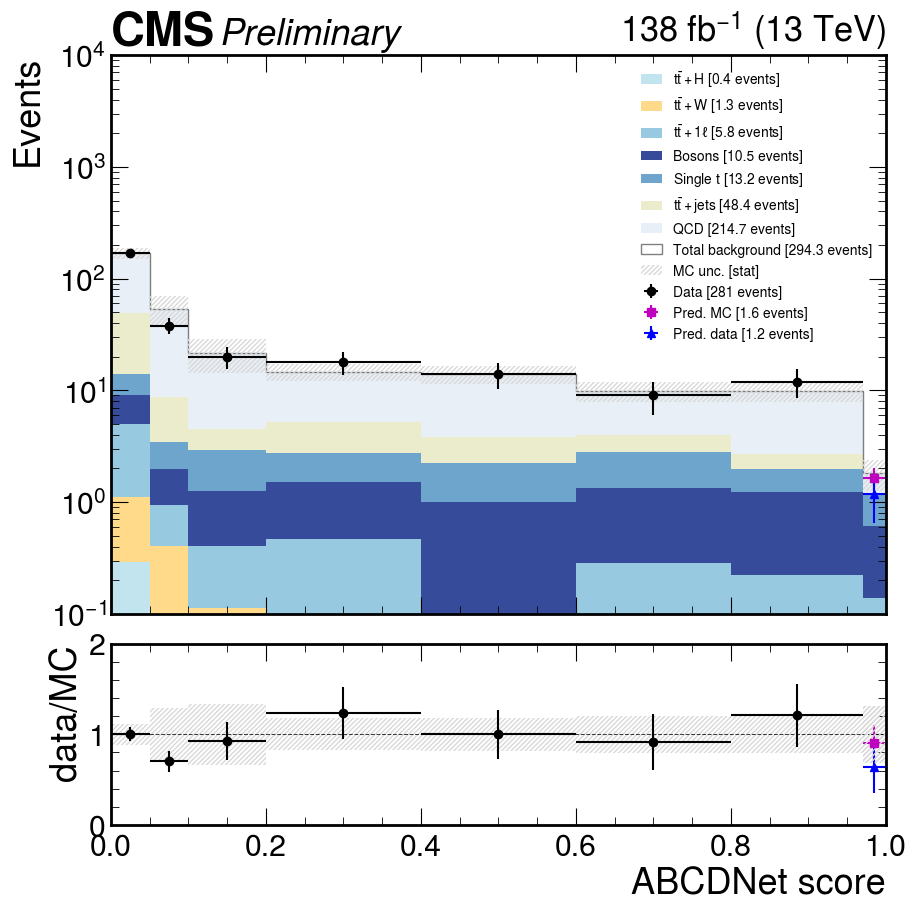

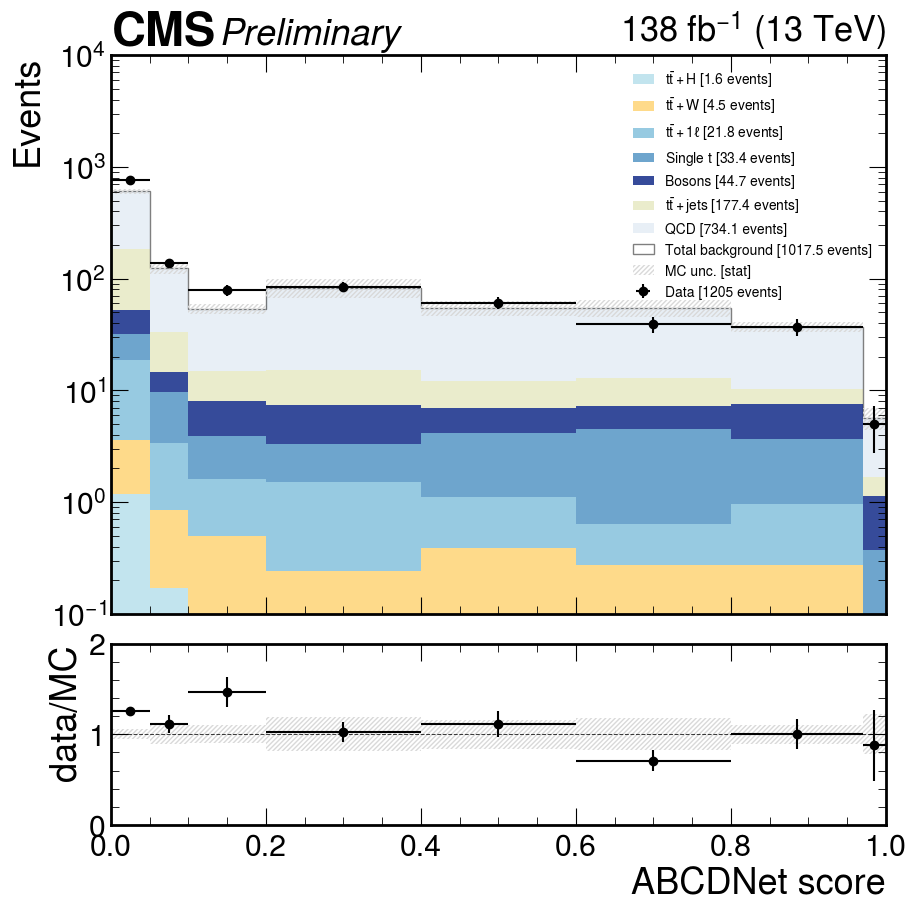

In [59]:
column = "abcdnet_score"
bins = [0, 0.05, 0.1, 0.2, 0.4, 0.6, 0.8, 0.97, 1.0]
x_label = r"ABCDNet score"

SR_like = "(hbbfatjet_xbb > 0.60 and ld_vqqfatjet_xwqq > 0.75 and tr_vqqfatjet_xwqq > 0.70)"
VBS_cut = "(abs_deta_jj > 4)"
BDT_cut = "(abcdnet_score > 0.97)"

vbsvvh.df["regionC"] = vbsvvh.df.eval(f"({SR_like} and {VBS_cut} and not {BDT_cut})")
vbsvvh.df["regionD"] = vbsvvh.df.eval(f"({SR_like} and not {VBS_cut} and not {BDT_cut})")
vbsvvh.df["regionB"] = vbsvvh.df.eval(f"({SR_like} and not {VBS_cut} and {BDT_cut})")
vbsvvh.df["regionA"] = vbsvvh.df.eval(f"({SR_like} and {VBS_cut} and {BDT_cut})")

DtoC = vbsvvh.data_count(selection="regionC")/vbsvvh.data_count(selection="regionD")
DtoC_mc = vbsvvh.bkg_count(selection="regionC")/vbsvvh.bkg_count(selection="regionD")


hist_axes, ratio_axes = vbsvvh.plot_data_vs_mc(
    column, 
    bins=bins, 
    selection=f"(regionA or regionC)",
    x_label=x_label,
    stacked=True,
    blinded_range=(0.97, 1),
    blinded_box=False,
    autoblind=False
)

# Get numerator (data) and denominator (bkg MC)
denom_df = vbsvvh.bkg_df(selection="regionA")
denom = yahist.Hist1D(
    denom_df[column],
    bins=bins,
    weights=denom_df.event_weight,
);
numer_df = vbsvvh.data_df(selection="regionB")
numer = yahist.Hist1D(
    numer_df[column],
    bins=bins,
    weights=numer_df.event_weight*DtoC,
    label=f"Pred. data [{len(numer_df)*DtoC:.1f} events]",
    color="b"
);
numer_mc_df = vbsvvh.bkg_df(selection="regionB")
numer_mc = yahist.Hist1D(
    numer_mc_df[column],
    bins=bins,
    weights=numer_mc_df.event_weight*DtoC_mc,
    label=f"Pred. MC [{np.sum(numer_mc_df.event_weight)*DtoC_mc:.1f} events]",
    color="m"
);
    
# Get ratio
ratio = numer/denom
# Set ratio errors to data relative stat error times the ratio
numer_counts = numer.counts
numer_counts[numer_counts == 0] = 1e-12
ratio._errors = (numer.errors/numer_counts)*ratio.counts

# Get ratio
ratio_mc = numer_mc/denom
# Set ratio errors to data relative stat error times the ratio
numer_mc_counts = numer_mc.counts
numer_mc_counts[numer_mc_counts == 0] = 1e-12
ratio_mc._errors = (numer_mc.errors/numer_mc_counts)*ratio_mc.counts

# Plot hists and ratio
numer_mc.plot(ax=hist_axes, errors=True, fmt="s")
ratio_mc.plot(ax=ratio_axes, errors=True, fmt="s")
numer.plot(ax=hist_axes, errors=True, fmt="^")
ratio.plot(ax=ratio_axes, errors=True, fmt="^")

# Plot MC relative stat error on unity; this makes no sense, but is LHC common practice
denom_counts = denom.counts
denom_counts[denom_counts == 0] = 1e-12
err_points = np.repeat(denom.edges, 2)[1:-1]
err_high = np.repeat(1 + denom.errors/denom_counts, 2)
err_low = np.repeat(1 - denom.errors/denom_counts, 2)
ratio_axes.fill_between(
    err_points, err_high, err_low,
    step="mid",
    hatch="///////",
    facecolor="none",
    edgecolor=(0.85, 0.85, 0.85),
    linewidth=0.0,
    linestyle="-",
    zorder=2
)

hist_axes.legend(fontsize=10)

ratio_axes.set_ylim([0., 2.0])
ratio_axes.legend().remove()

hist_axes.set_yscale("log")
hist_axes.autoscale()
hist_axes.set_ylim(bottom=1e-1, top=1e4)
hist_axes.margins(x=0)
plt.savefig(f"{plots_dir}/regionsAC_closure.pdf")


# bins = [
#     0.0, 0.05, 0.1, 0.15, 0.2, 0.25, 0.3, 0.35, 0.4, 0.45, 0.5, 
#     0.55, 0.6, 0.65, 0.7, 0.75, 0.8, 0.85, 0.9, 0.97, 1.0
# ]
hist_axes, ratio_axes = vbsvvh.plot_data_vs_mc(
    "abcdnet_score", 
    bins=bins, 
    selection="(regionB or regionD)",
    x_label=r"ABCDNet score",
    stacked=True,
    autoblind=False,
    logy=True
)
ratio_axes.set_ylim([0., 2.0]);
hist_axes.set_ylim(bottom=1e-1, top=1e4);
hist_axes.legend(fontsize=10);
plt.savefig(f"{plots_dir}/regionsBD_closure.pdf")

In [19]:
column = "bdt"
bins = np.linspace(0, 1, 11)
x_label = r"BDT score"

SR_like = (
    "hbbfatjet_xbb > 0.9 and ld_vqqfatjet_xwqq > 0.65 and tr_vqqfatjet_xwqq > 0.7"
    + " and ST > 1300"
    + " and hbbfatjet_mass < 150"
    + " and ld_vqqfatjet_mass < 120 and tr_vqqfatjet_mass < 120"
)
SR_like = f"({SR_like})"
VBS_cut = "(M_jj > 700 and abs(deta_jj) > 4)"
BDT_cut = "(bdt > 0.6)"

vbsvvh.df["regionA"] = vbsvvh.df.eval(f"({SR_like} and {VBS_cut} and not {BDT_cut})")
vbsvvh.df["regionB"] = vbsvvh.df.eval(f"({SR_like} and not {VBS_cut} and not {BDT_cut})")
vbsvvh.df["regionC"] = vbsvvh.df.eval(f"({SR_like} and not {VBS_cut} and {BDT_cut})")
vbsvvh.df["regionD"] = vbsvvh.df.eval(f"({SR_like} and {VBS_cut} and {BDT_cut})")

BtoA = vbsvvh.data_count(selection=regionA)/vbsvvh.data_count(selection=regionB)
BtoA_mc = vbsvvh.bkg_count(selection=regionA)/vbsvvh.bkg_count(selection=regionB)


hist_axes, ratio_axes = vbsvvh.plot_data_vs_mc(
    column, 
    bins=bins, 
    selection=f"(regionA or regionD)",
    x_label=x_label,
    stacked=True,
    blinded_range=(0.6, 1),
    blinded_box=False,
    autoblind=False
)

# Get numerator (data) and denominator (bkg MC)
denom_df = vbsvvh.bkg_df(selection="regionD")
denom = yahist.Hist1D(
    denom_df[column],
    bins=bins,
    weights=denom_df.event_weight,
);
numer_df = vbsvvh.data_df(selection="regionC")
numer = yahist.Hist1D(
    numer_df[column],
    bins=bins,
    weights=numer_df.event_weight*BtoA,
    label=f"Pred. data [{len(numer_df)*BtoA:.1f} events]",
    color="b"
);
numer_mc_df = vbsvvh.bkg_df(selection="regionC")
numer_mc = yahist.Hist1D(
    numer_mc_df[column],
    bins=bins,
    weights=numer_mc_df.event_weight*BtoA_mc,
    label=f"Pred. MC [{np.sum(numer_mc_df.event_weight)*BtoA_mc:.1f} events]",
    color="m"
);
    
# Get ratio
ratio = numer/denom
# Set ratio errors to data relative stat error times the ratio
numer_counts = numer.counts
numer_counts[numer_counts == 0] = 1e-12
ratio._errors = (numer.errors/numer_counts)*ratio.counts

# Get ratio
ratio_mc = numer_mc/denom
# Set ratio errors to data relative stat error times the ratio
numer_mc_counts = numer_mc.counts
numer_mc_counts[numer_mc_counts == 0] = 1e-12
ratio_mc._errors = (numer_mc.errors/numer_mc_counts)*ratio_mc.counts

# Plot hists and ratio
numer_mc.plot(ax=hist_axes, errors=True, fmt="s")
ratio_mc.plot(ax=ratio_axes, errors=True, fmt="s")
numer.plot(ax=hist_axes, errors=True, fmt="^")
ratio.plot(ax=ratio_axes, errors=True, fmt="^")

# Plot MC relative stat error on unity; this makes no sense, but is LHC common practice
denom_counts = denom.counts
denom_counts[denom_counts == 0] = 1e-12
err_points = np.repeat(denom.edges, 2)[1:-1]
err_high = np.repeat(1 + denom.errors/denom_counts, 2)
err_low = np.repeat(1 - denom.errors/denom_counts, 2)
ratio_axes.fill_between(
    err_points, err_high, err_low,
    step="mid",
    hatch="///////",
    facecolor="none",
    edgecolor=(0.85, 0.85, 0.85),
    linewidth=0.0,
    linestyle="-",
    zorder=2
)

hist_axes.legend(fontsize=14)

ratio_axes.set_ylim([0., 2.0])
ratio_axes.legend().remove()

# plt.savefig(f"{plots_dir}/regionsAD_closure.pdf")

NameError: name 'regionA' is not defined

Wrote plot to /home/users/jguiang/public_html/vbsvvhjets_plots/pnetfix/val/bdt_data_vs_mc_(regionB_or_regionC).pdf


(0.0, 2.0)

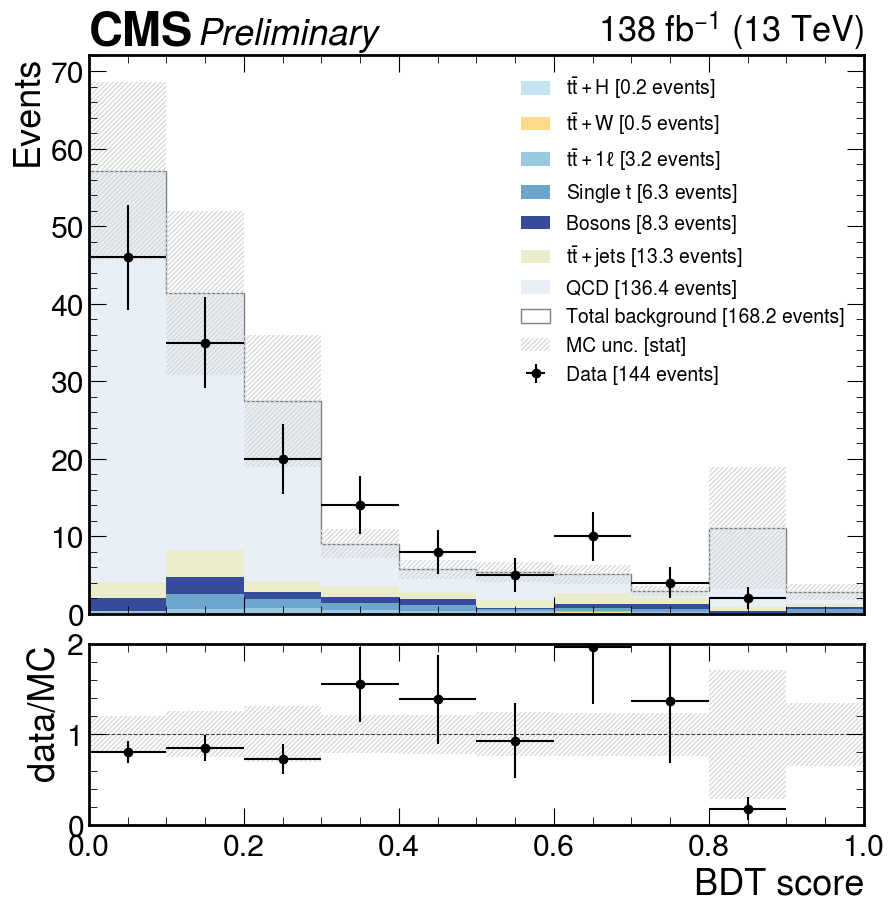

In [22]:
hist_axes, ratio_axes = vbsvvh.plot_data_vs_mc(
    "bdt", 
    bins=np.linspace(0, 1, 11), 
    selection="(regionB or regionC)",
#     blinded_range=(1500, 1800) if selection == "regionC" or selection == "regionA" else None,
    x_label=r"BDT score",
#     norm=True,
    stacked=True,
    autoblind=False
)

ratio_axes.set_ylim([0., 2.0])
# plt.savefig(f"{plots_dir}/regionsBC_closure.pdf")

In [5]:
history = {}

def plot_many(plot_tuples, sel="obj_sel", norm=False, sig_scale=0, year=None):
    if year:
        sel = f"{sel} and abs(year) == {year}"
    for var, bins, label in plot_tuples:
        if year:
            if year == 2016:
                vbsvvh.lumi = 36.33
            elif year == 2017:
                vbsvvh.lumi = 41.48
            elif year == 2018:
                vbsvvh.lumi = 59.83
        
        plot_hash = hash((var, sel, norm, year))
        plot_subhash = hash((",".join(bins.astype(str)), sig_scale, label))
        if history.get(plot_hash, None) != plot_subhash:
            vbsvvh.plot_data_vs_mc(
                var, bins, selection=sel, norm=norm, x_label=label, sig_scale=sig_scale, stacked=True
            )
            history[plot_hash] = plot_subhash
        else:
            print("This plot has already been plotted during the runtime of this kernel")
            
        if year:
            vbsvvh.lumi = 138

Wrote plot to /home/users/jguiang/public_html/vbsvvhjets_plots/ptqcd/val/hbbfatjet_xbb_data_vs_mc_obj_sel.pdf
Wrote plot to /home/users/jguiang/public_html/vbsvvhjets_plots/ptqcd/val/ld_vqqfatjet_xwqq_data_vs_mc_obj_sel.pdf
Wrote plot to /home/users/jguiang/public_html/vbsvvhjets_plots/ptqcd/val/tr_vqqfatjet_xwqq_data_vs_mc_obj_sel.pdf


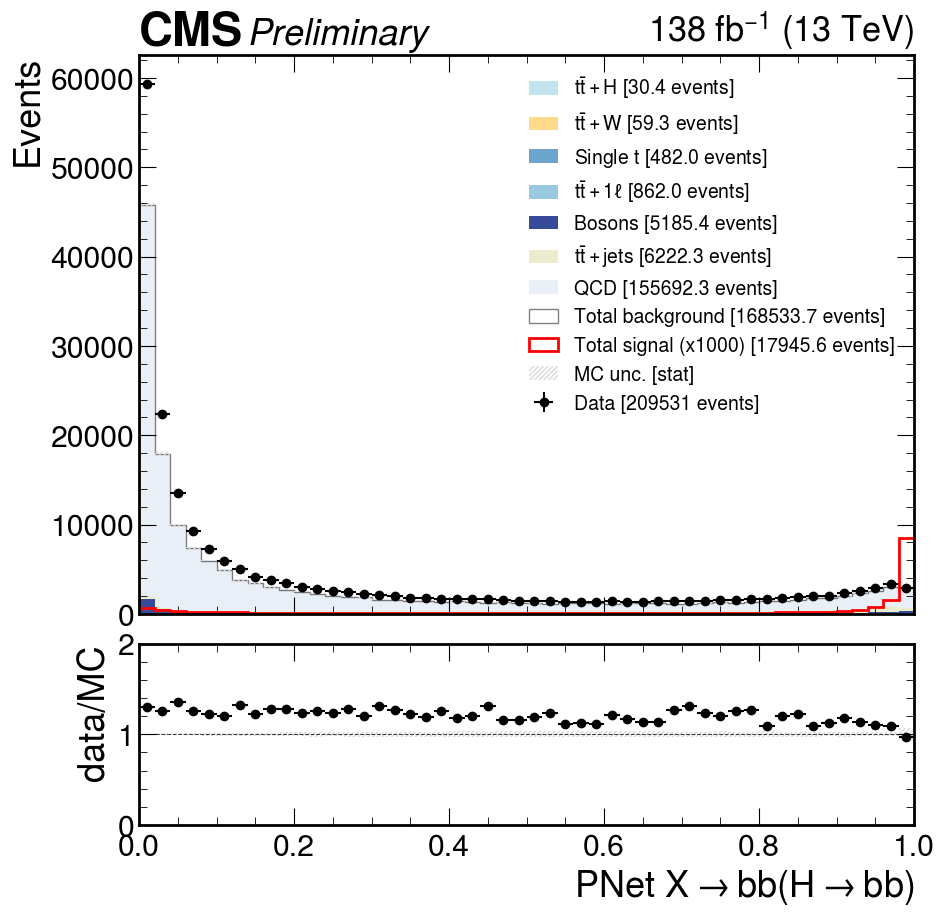

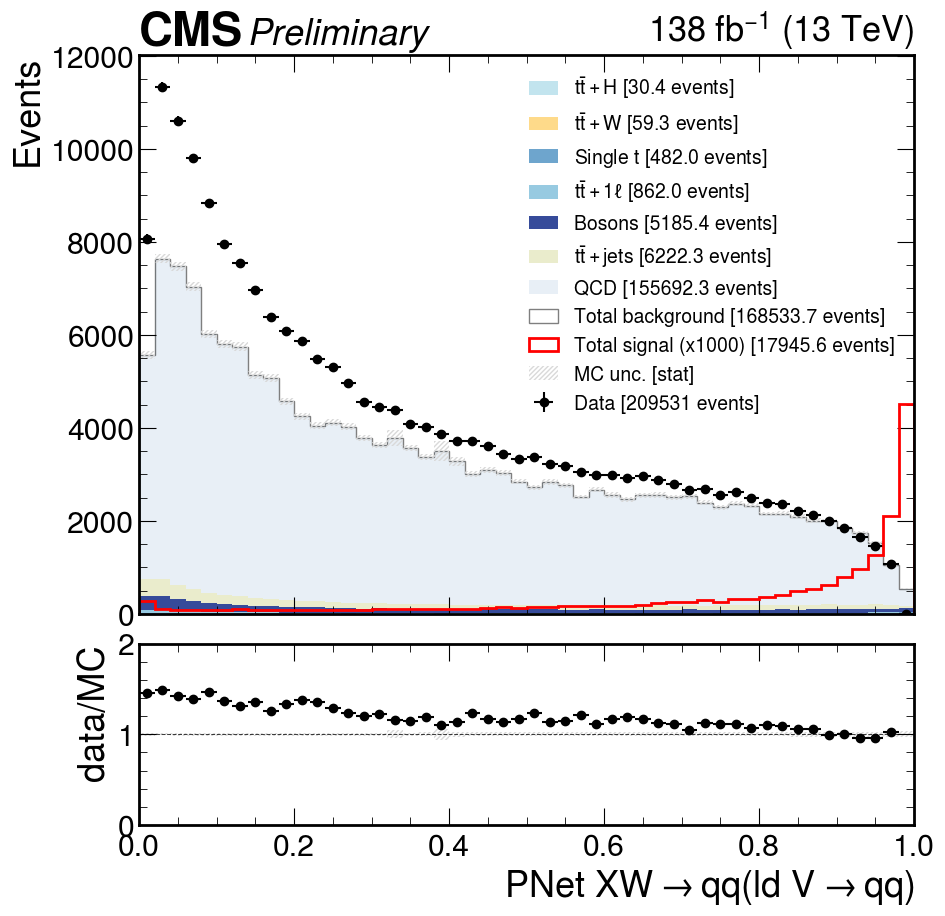

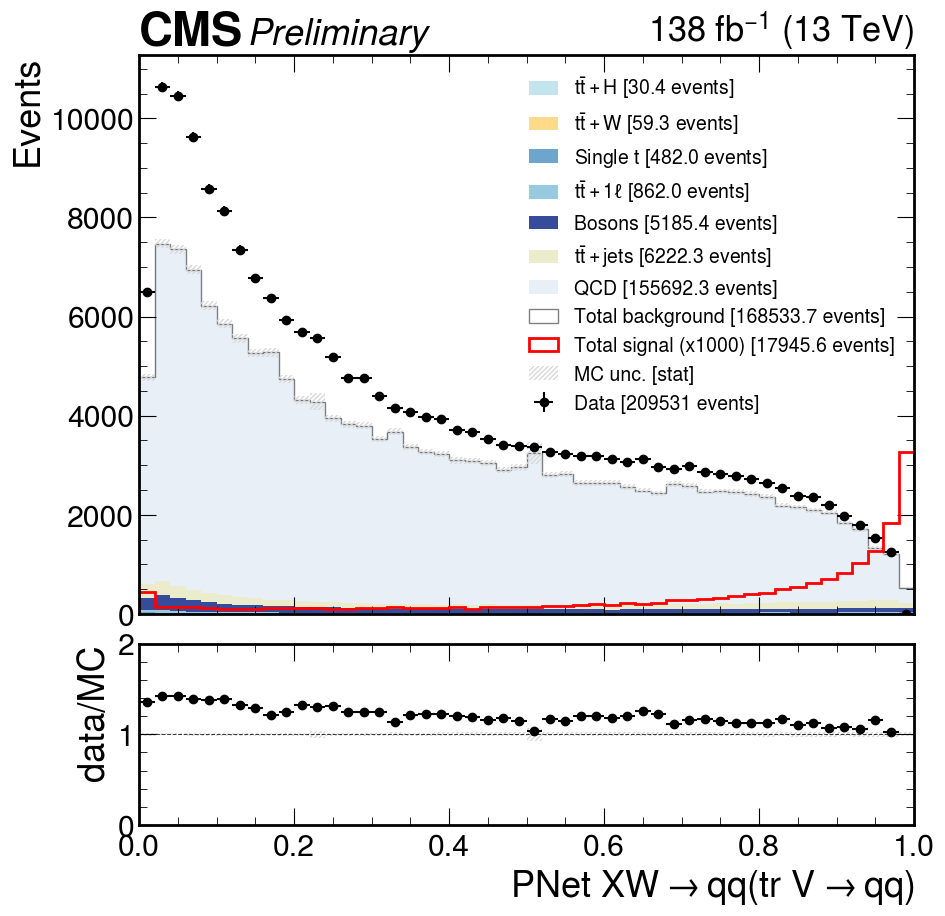

In [6]:
nbins = 50

plot_many(
    [
        # Fat jet ParticleNet score
        ("hbbfatjet_xbb", np.linspace(0, 1, nbins+1), r"PNet $X\rightarrow bb(H\rightarrow bb)$"),
        ("ld_vqqfatjet_xwqq", np.linspace(0, 1, nbins+1), r"PNet $XW\rightarrow qq($ld $V\rightarrow qq)$"),
        ("tr_vqqfatjet_xwqq", np.linspace(0, 1, nbins+1), r"PNet $XW\rightarrow qq($tr $V\rightarrow qq)$"),
    ],
    sel="obj_sel",
    norm=False,
    sig_scale=1000
)

Wrote plot to /home/users/jguiang/public_html/vbsvvhjets_plots/pnetfix/val/hbbfatjet_eta_data_vs_mc_obj_sel_and_abs(year)_eq_2016.pdf
Wrote plot to /home/users/jguiang/public_html/vbsvvhjets_plots/pnetfix/val/ld_vqqfatjet_eta_data_vs_mc_obj_sel_and_abs(year)_eq_2016.pdf
Wrote plot to /home/users/jguiang/public_html/vbsvvhjets_plots/pnetfix/val/tr_vqqfatjet_eta_data_vs_mc_obj_sel_and_abs(year)_eq_2016.pdf
Wrote plot to /home/users/jguiang/public_html/vbsvvhjets_plots/pnetfix/val/hbbfatjet_eta_data_vs_mc_obj_sel_and_abs(year)_eq_2017.pdf
Wrote plot to /home/users/jguiang/public_html/vbsvvhjets_plots/pnetfix/val/ld_vqqfatjet_eta_data_vs_mc_obj_sel_and_abs(year)_eq_2017.pdf
Wrote plot to /home/users/jguiang/public_html/vbsvvhjets_plots/pnetfix/val/tr_vqqfatjet_eta_data_vs_mc_obj_sel_and_abs(year)_eq_2017.pdf
Wrote plot to /home/users/jguiang/public_html/vbsvvhjets_plots/pnetfix/val/hbbfatjet_eta_data_vs_mc_obj_sel_and_abs(year)_eq_2018.pdf
Wrote plot to /home/users/jguiang/public_html/vbsv

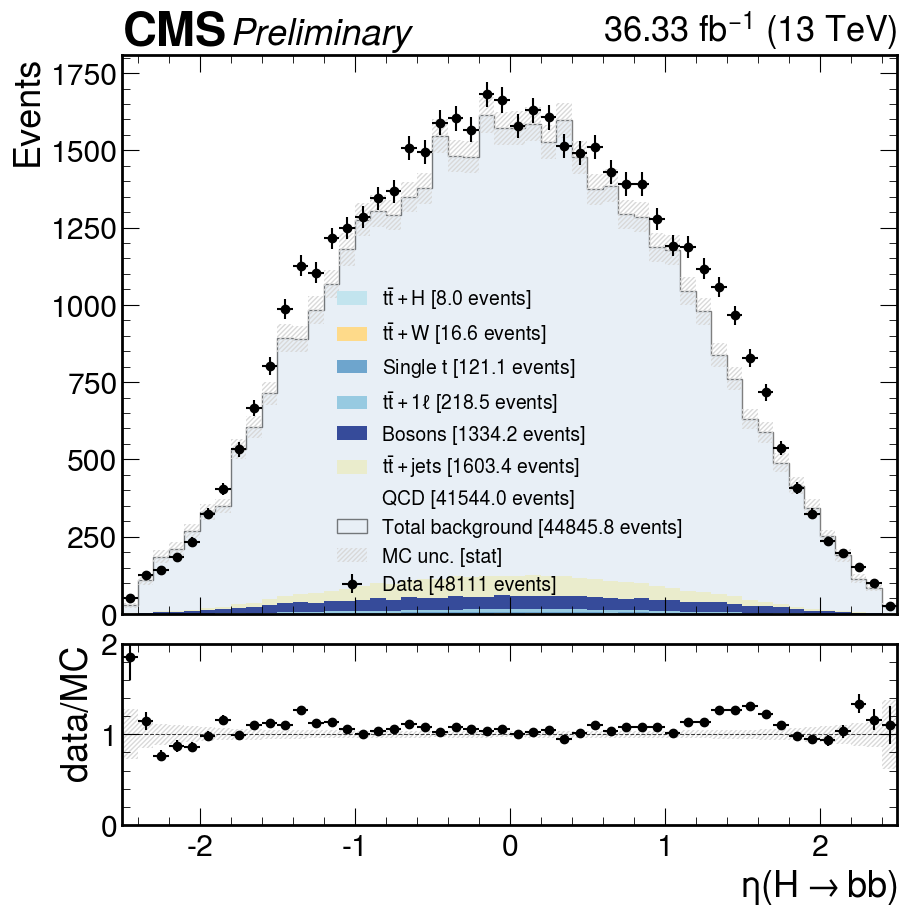

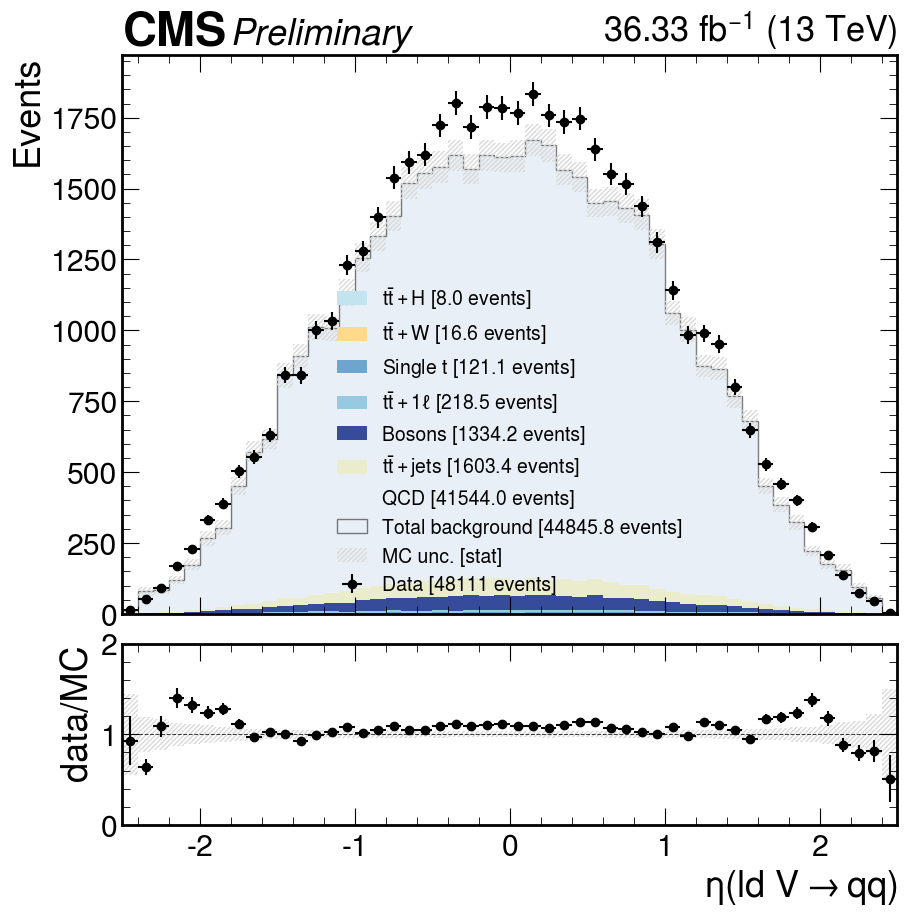

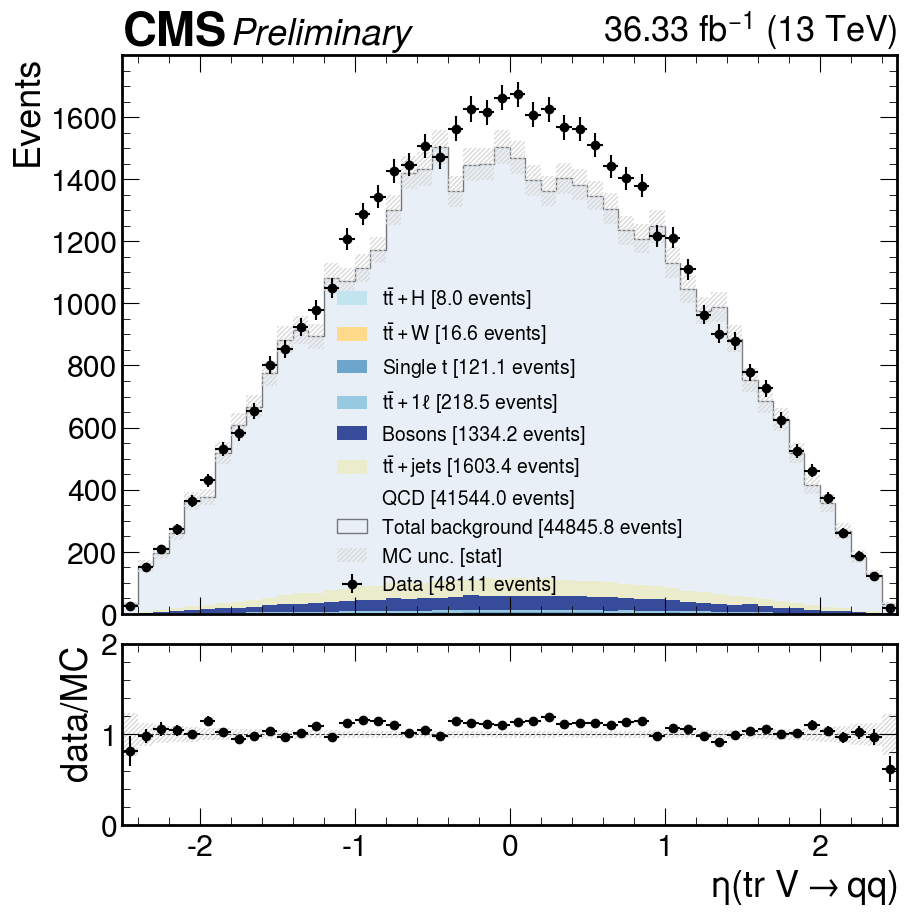

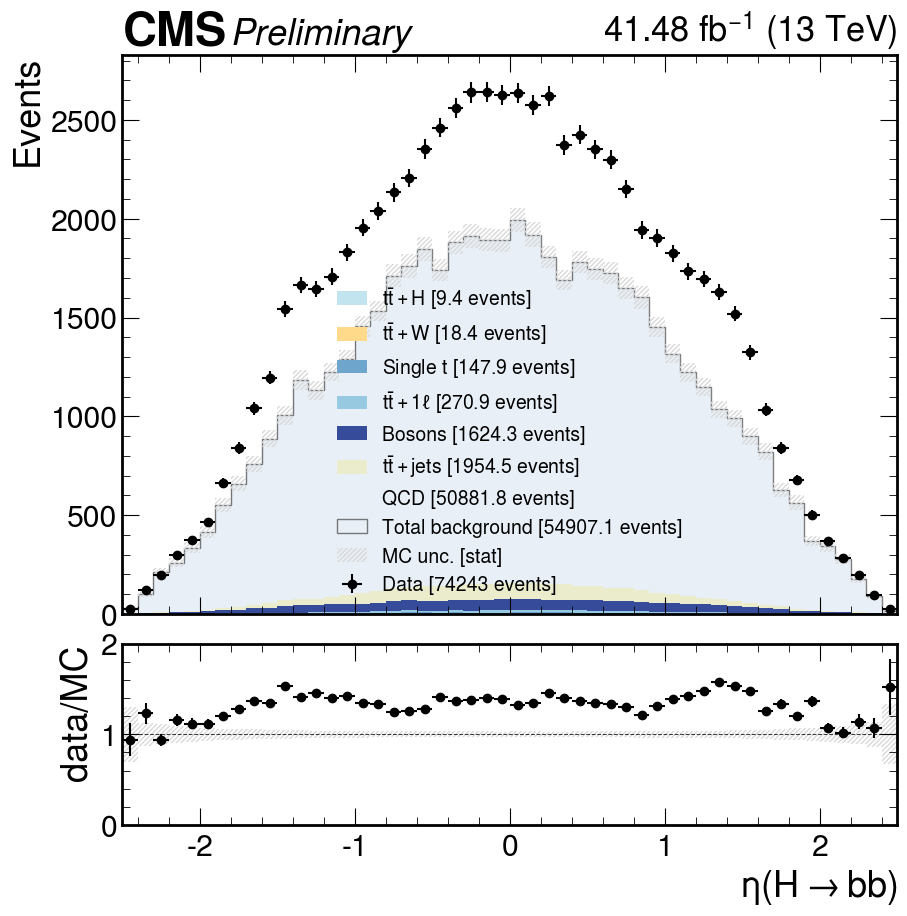

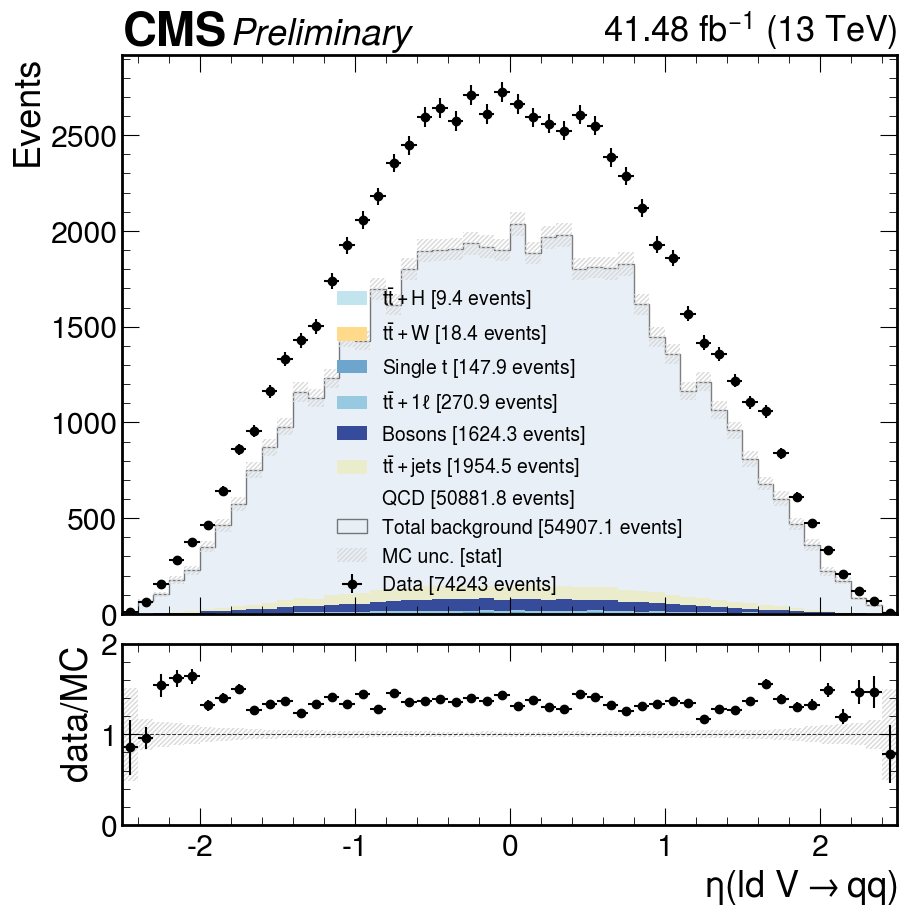

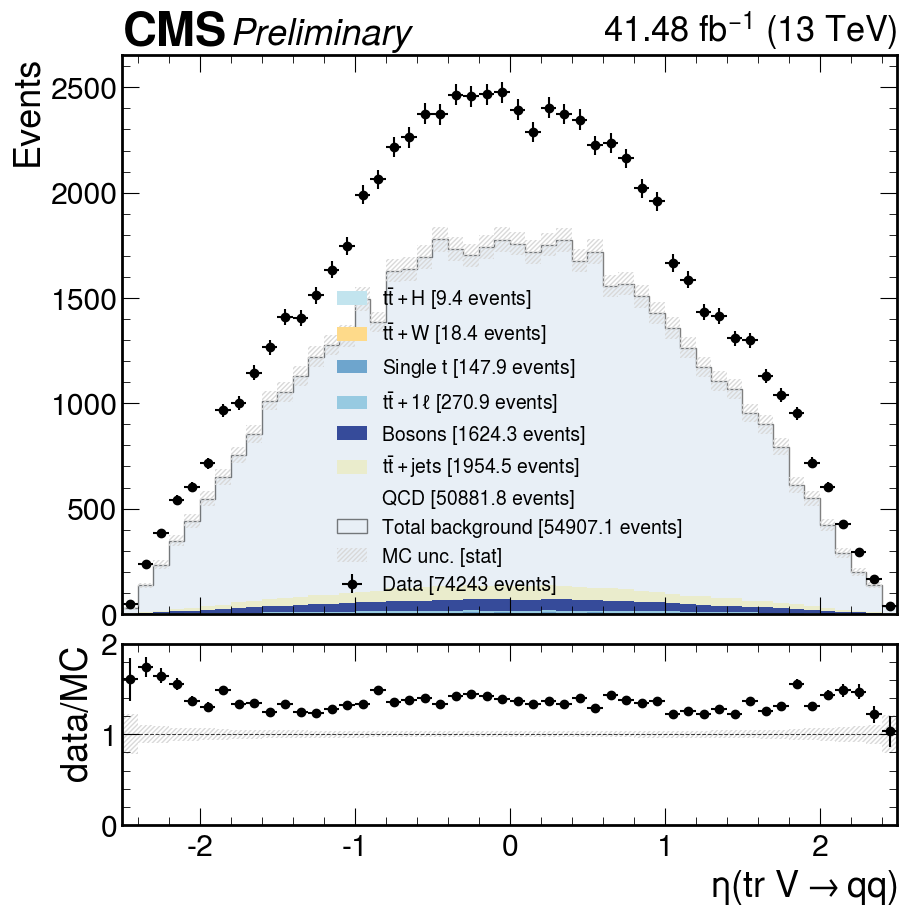

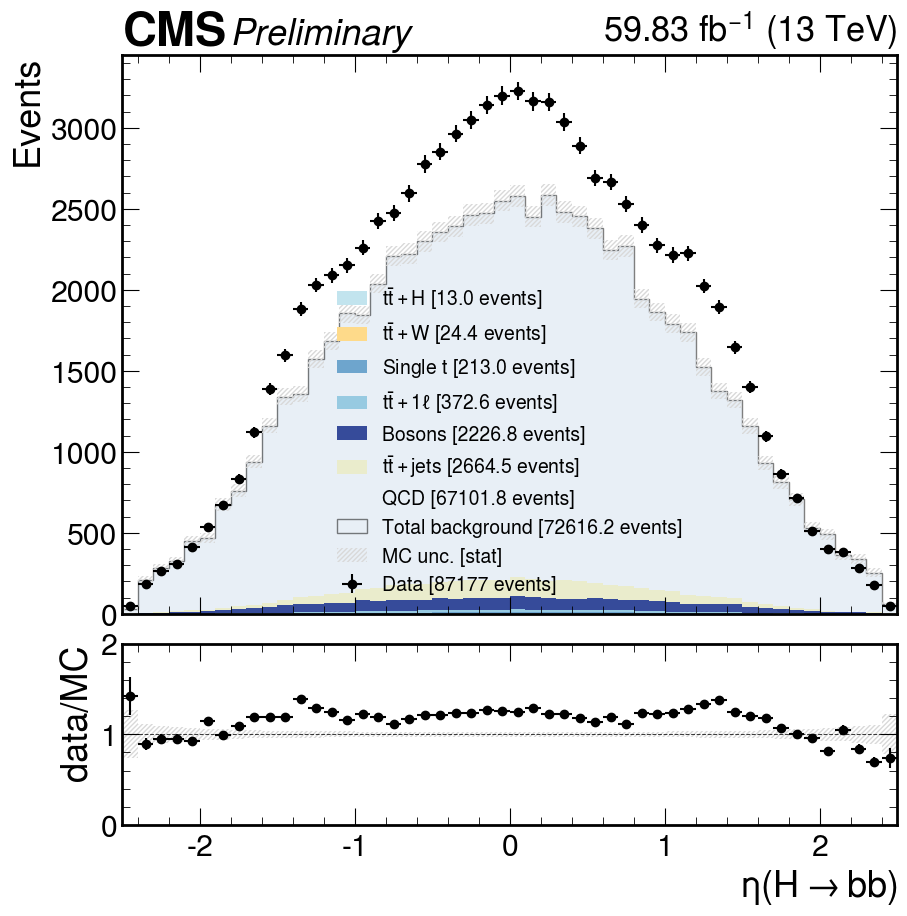

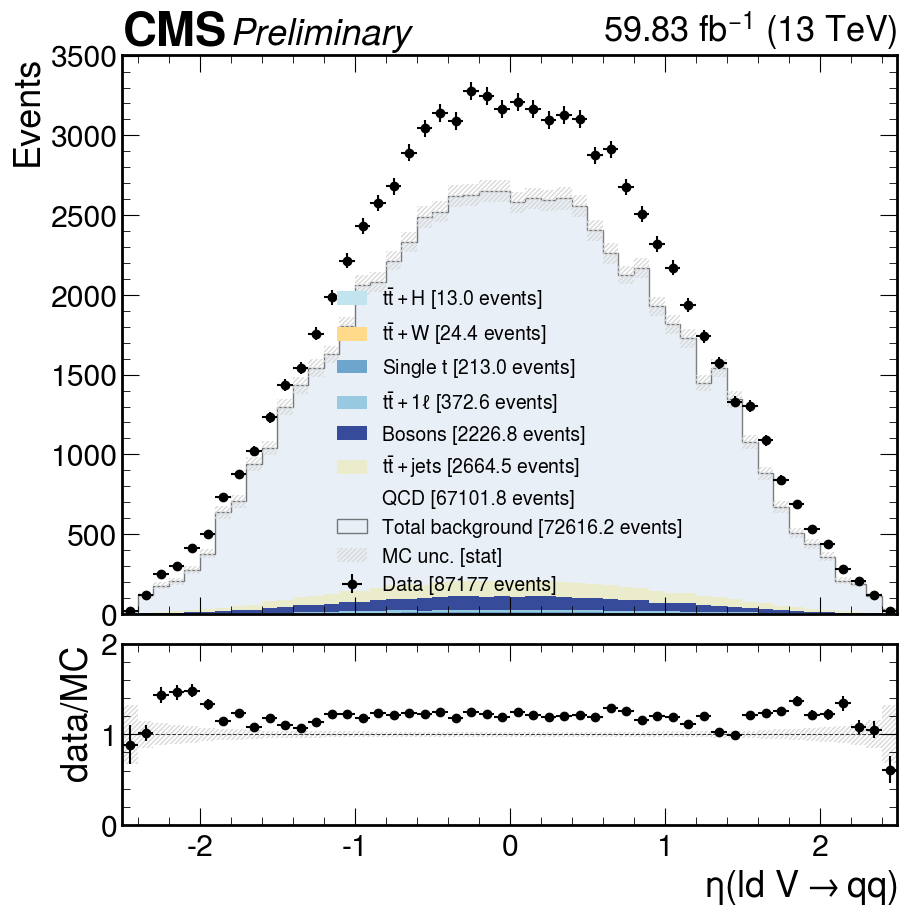

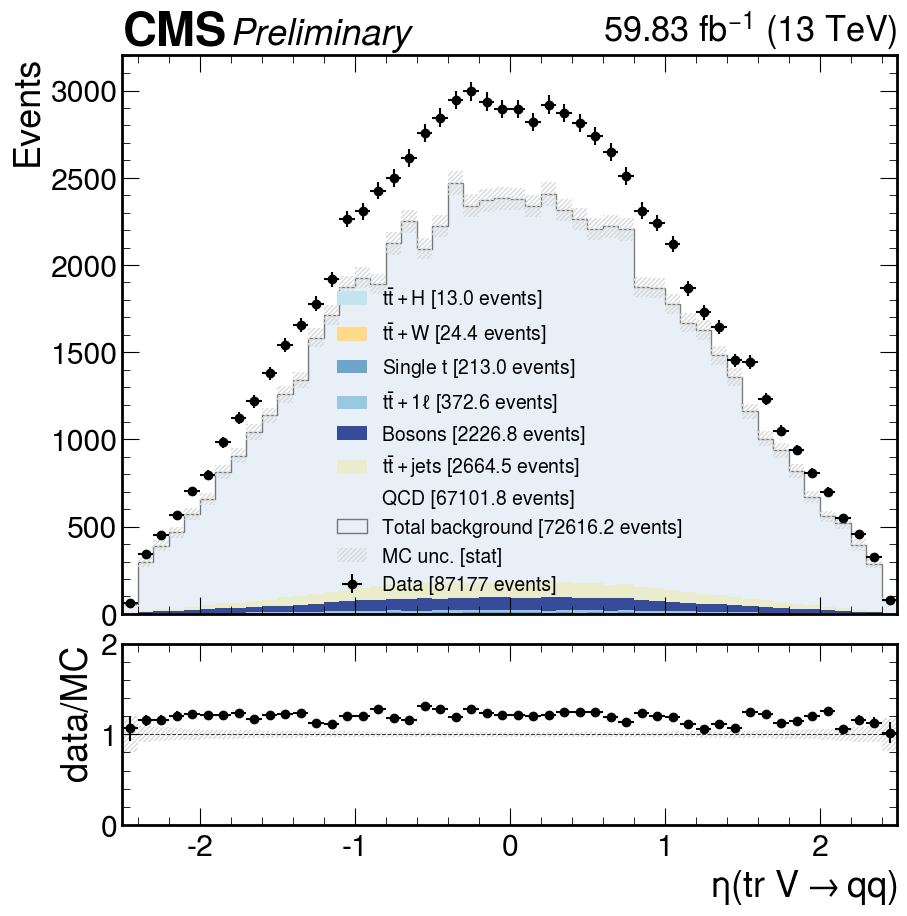

In [50]:
nbins = 50

for year in [2016, 2017, 2018]:
    plot_many(
        [
            # Fat jet eta
            ("hbbfatjet_eta", np.linspace(-2.5, 2.5, nbins+1), r"$\eta(H\rightarrow bb)$"),
            ("ld_vqqfatjet_eta", np.linspace(-2.5, 2.5, nbins+1), r"$\eta($ld $V\rightarrow qq)$"),
            ("tr_vqqfatjet_eta", np.linspace(-2.5, 2.5, nbins+1), r"$\eta($tr $V\rightarrow qq)$"),
        ],
        sel=f"obj_sel",
        norm=False,
        sig_scale=0,
        year=year
    )

In [6]:
nbins = 50

plot_many(
    [
        # VVH variables
        ("M_VVH", np.linspace(1000, 5000, nbins+1), r"$M_{VVH}$ [GeV]"),
        ("dphi_VV", np.linspace(-4, 4, nbins+1), r"$\Delta\phi($ld $V\rightarrow qq, $tr $V \rightarrow qq)$"),
        ("dphi_ldVH", np.linspace(-4, 4, nbins+1), r"$\Delta\phi(H\rightarrow b\bar{b}, $ld $V \rightarrow qq)$"),
        ("dphi_trVH", np.linspace(-4, 4, nbins+1), r"$\Delta\phi(H\rightarrow b\bar{b}, $tr $V \rightarrow qq)$"),
    ],
    sel="obj_sel",
    norm=False,
    sig_scale=0
)

NameError: name 'plot_many' is not defined

Wrote plot to /home/users/jguiang/public_html/vbsvvhjets_plots/ptqcd/val/ST_data_vs_mc_obj_sel.pdf
Wrote plot to /home/users/jguiang/public_html/vbsvvhjets_plots/ptqcd/val/HT_data_vs_mc_obj_sel.pdf
Wrote plot to /home/users/jguiang/public_html/vbsvvhjets_plots/ptqcd/val/HT_fat_data_vs_mc_obj_sel.pdf
Wrote plot to /home/users/jguiang/public_html/vbsvvhjets_plots/ptqcd/val/MET_data_vs_mc_obj_sel.pdf
Wrote plot to /home/users/jguiang/public_html/vbsvvhjets_plots/ptqcd/val/n_jets_data_vs_mc_obj_sel.pdf
Wrote plot to /home/users/jguiang/public_html/vbsvvhjets_plots/ptqcd/val/n_fatjets_data_vs_mc_obj_sel.pdf
Wrote plot to /home/users/jguiang/public_html/vbsvvhjets_plots/ptqcd/val/M_jj_data_vs_mc_obj_sel.pdf
Wrote plot to /home/users/jguiang/public_html/vbsvvhjets_plots/ptqcd/val/abs_deta_jj_data_vs_mc_obj_sel.pdf
Wrote plot to /home/users/jguiang/public_html/vbsvvhjets_plots/ptqcd/val/ld_vbsjet_pt_data_vs_mc_obj_sel.pdf
Wrote plot to /home/users/jguiang/public_html/vbsvvhjets_plots/ptqcd/val

/home/users/jguiang/projects/vbs/notebooks/utils/analysis.py:711: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure()


Wrote plot to /home/users/jguiang/public_html/vbsvvhjets_plots/ptqcd/val/ld_vqqfatjet_mass_data_vs_mc_obj_sel.pdf
Wrote plot to /home/users/jguiang/public_html/vbsvvhjets_plots/ptqcd/val/tr_vqqfatjet_mass_data_vs_mc_obj_sel.pdf
Wrote plot to /home/users/jguiang/public_html/vbsvvhjets_plots/ptqcd/val/hbbfatjet_pt_data_vs_mc_obj_sel.pdf
Wrote plot to /home/users/jguiang/public_html/vbsvvhjets_plots/ptqcd/val/ld_vqqfatjet_pt_data_vs_mc_obj_sel.pdf
Wrote plot to /home/users/jguiang/public_html/vbsvvhjets_plots/ptqcd/val/tr_vqqfatjet_pt_data_vs_mc_obj_sel.pdf
Wrote plot to /home/users/jguiang/public_html/vbsvvhjets_plots/ptqcd/val/hbbfatjet_eta_data_vs_mc_obj_sel.pdf
Wrote plot to /home/users/jguiang/public_html/vbsvvhjets_plots/ptqcd/val/ld_vqqfatjet_eta_data_vs_mc_obj_sel.pdf
Wrote plot to /home/users/jguiang/public_html/vbsvvhjets_plots/ptqcd/val/tr_vqqfatjet_eta_data_vs_mc_obj_sel.pdf


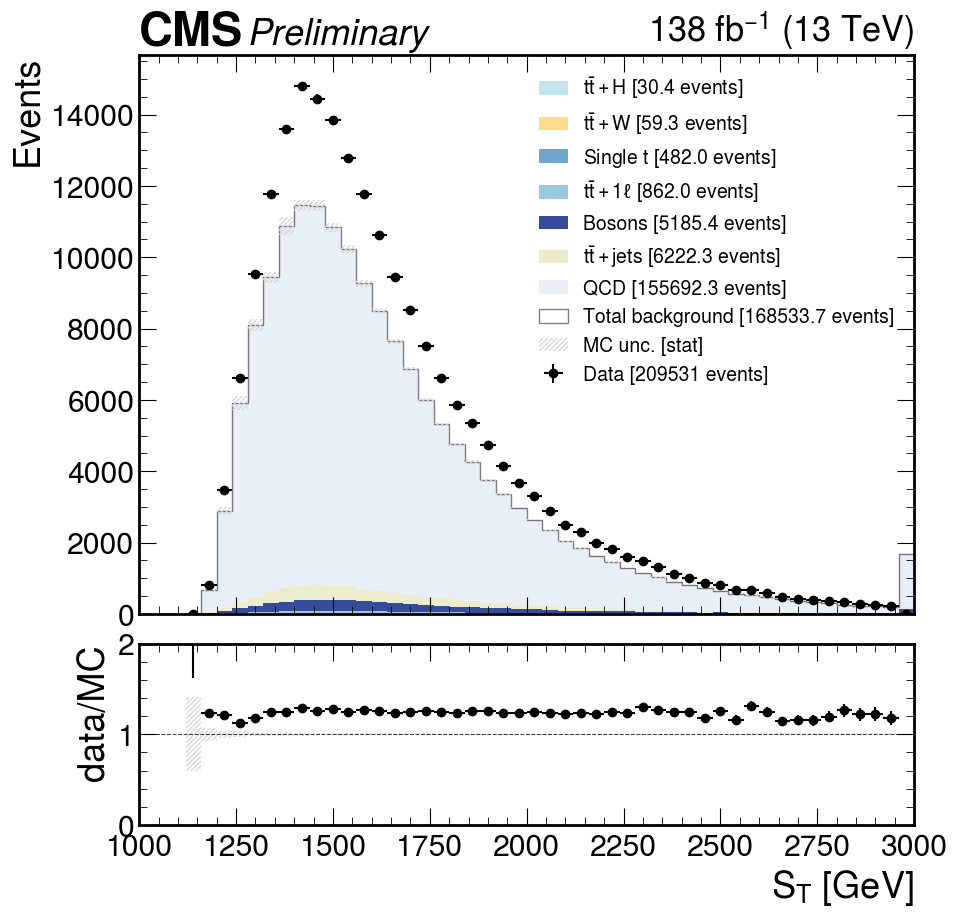

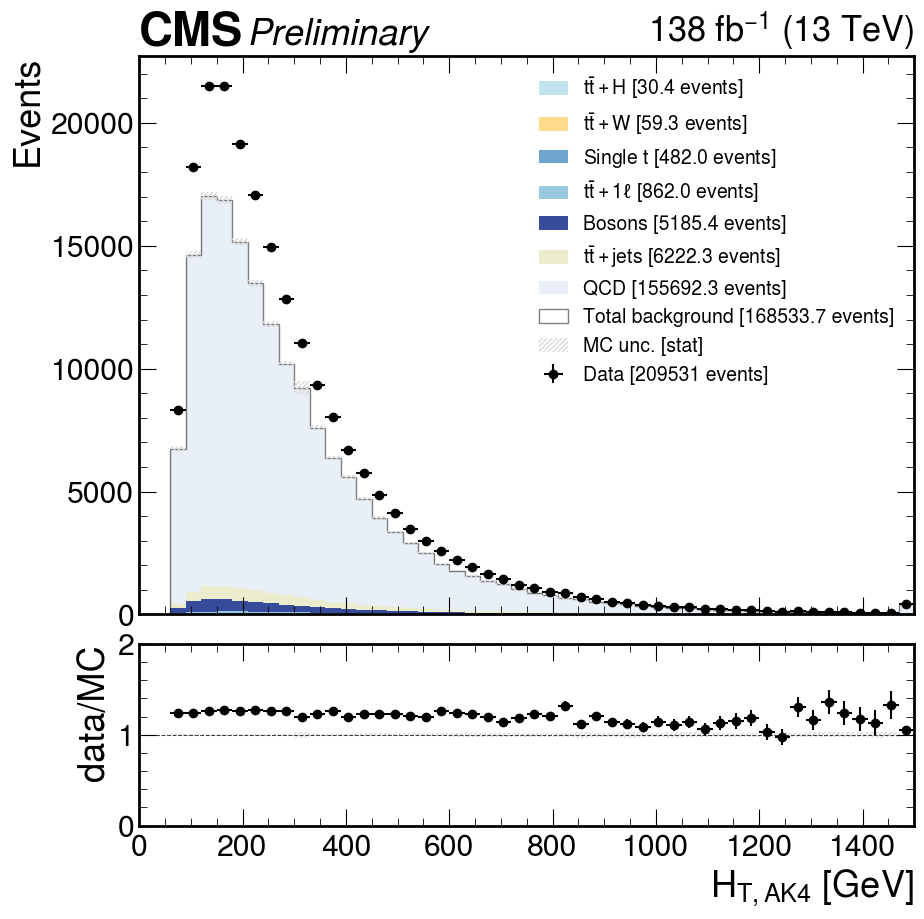

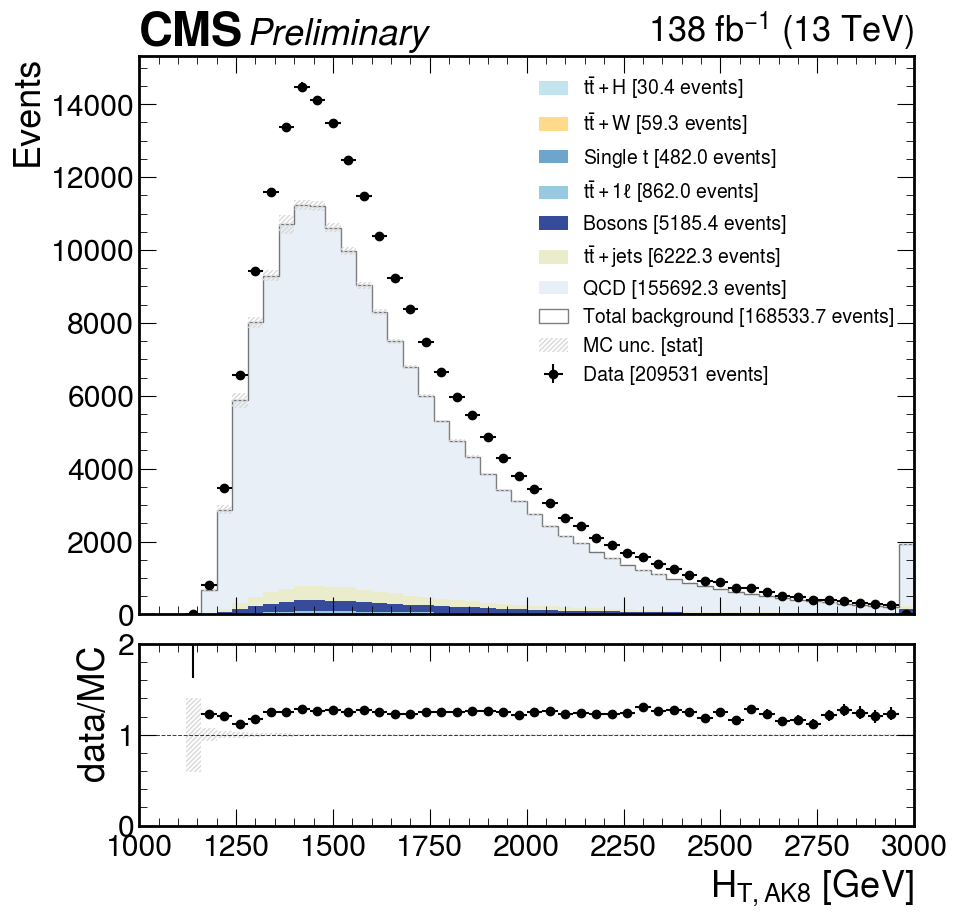

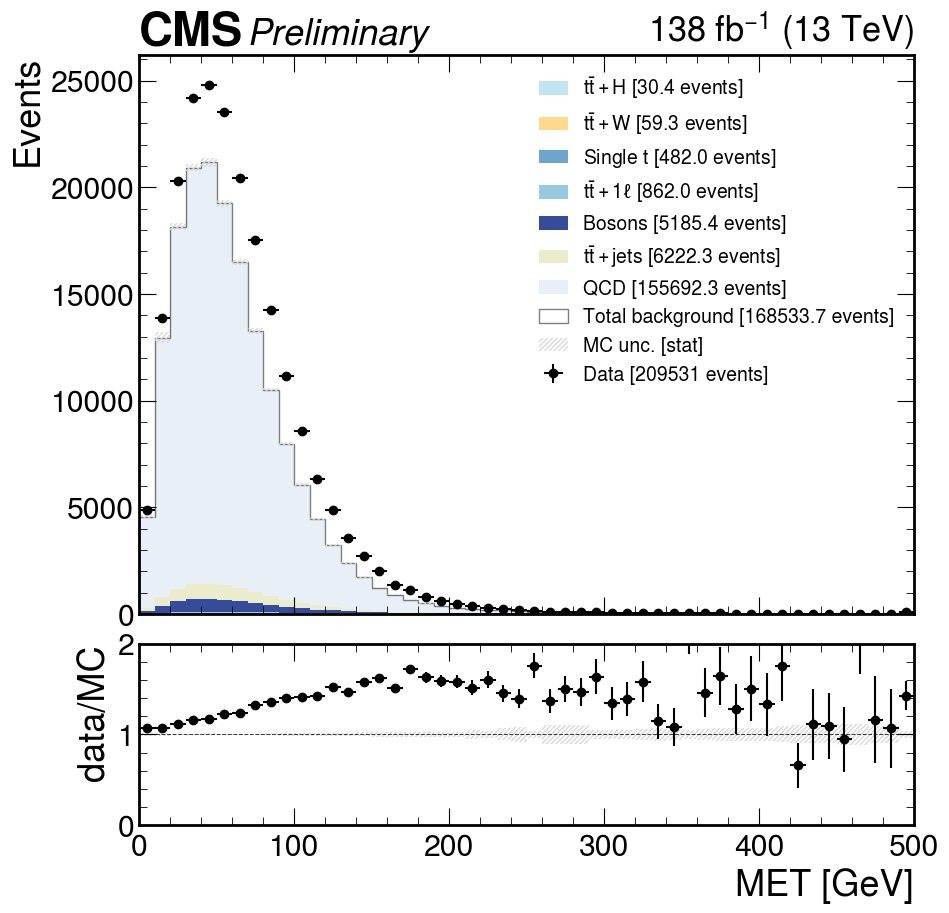

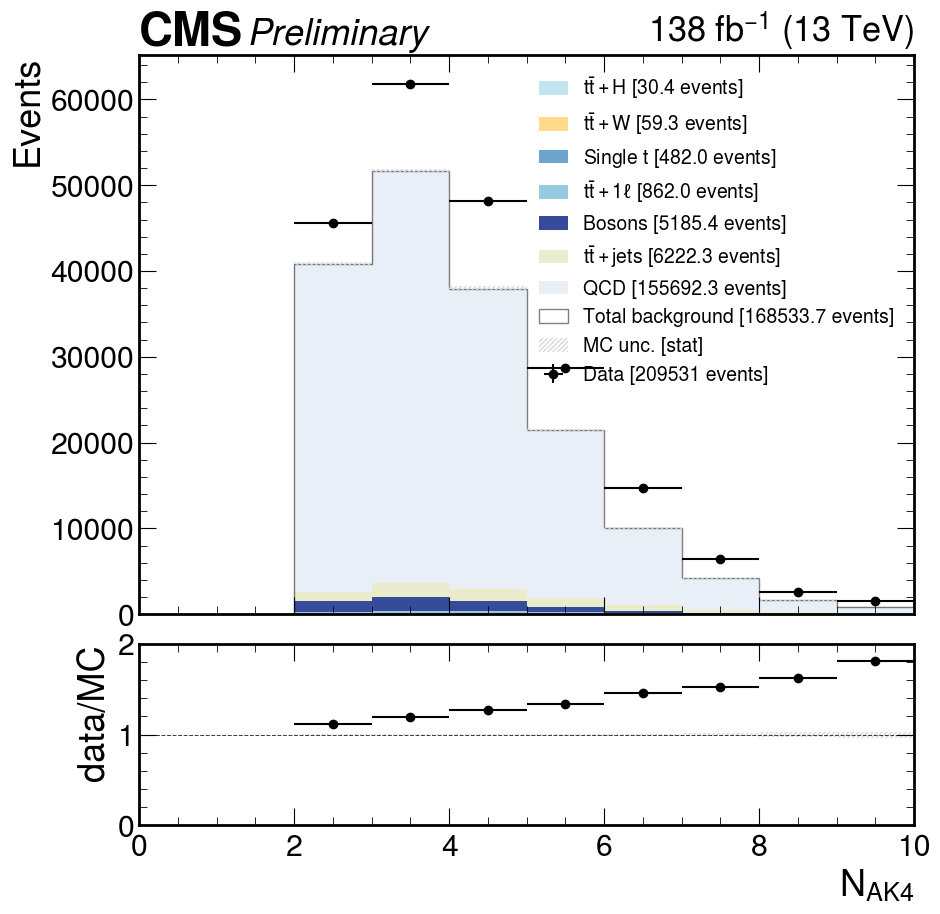

...

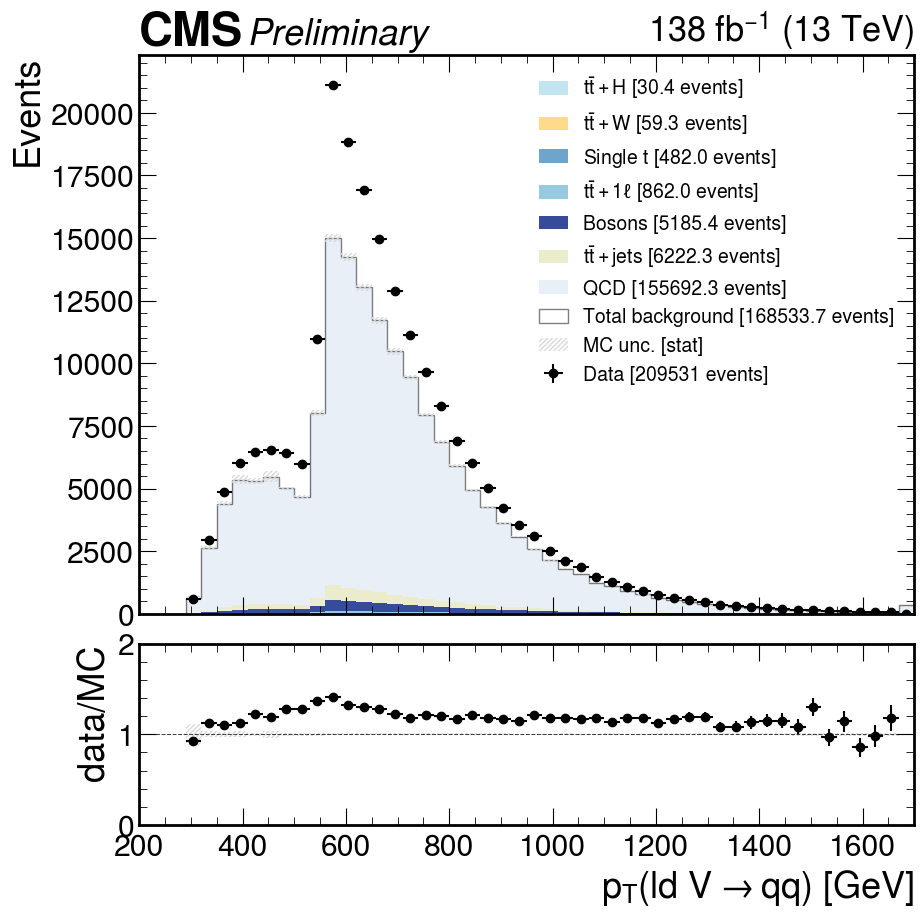

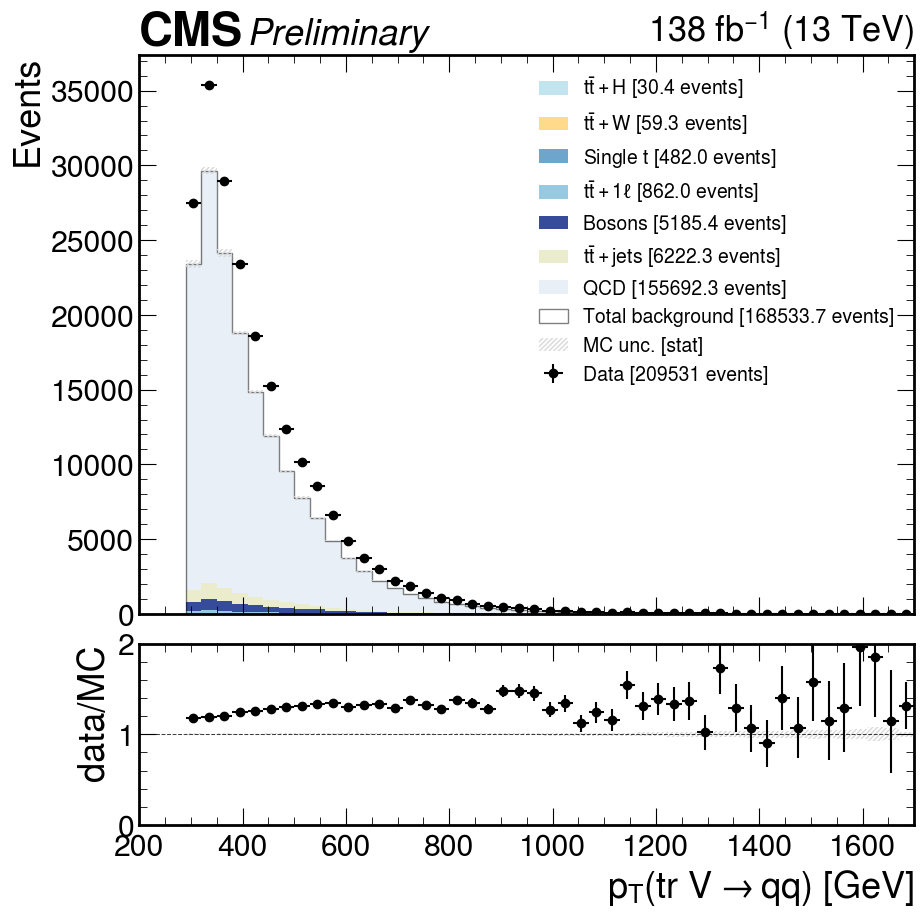

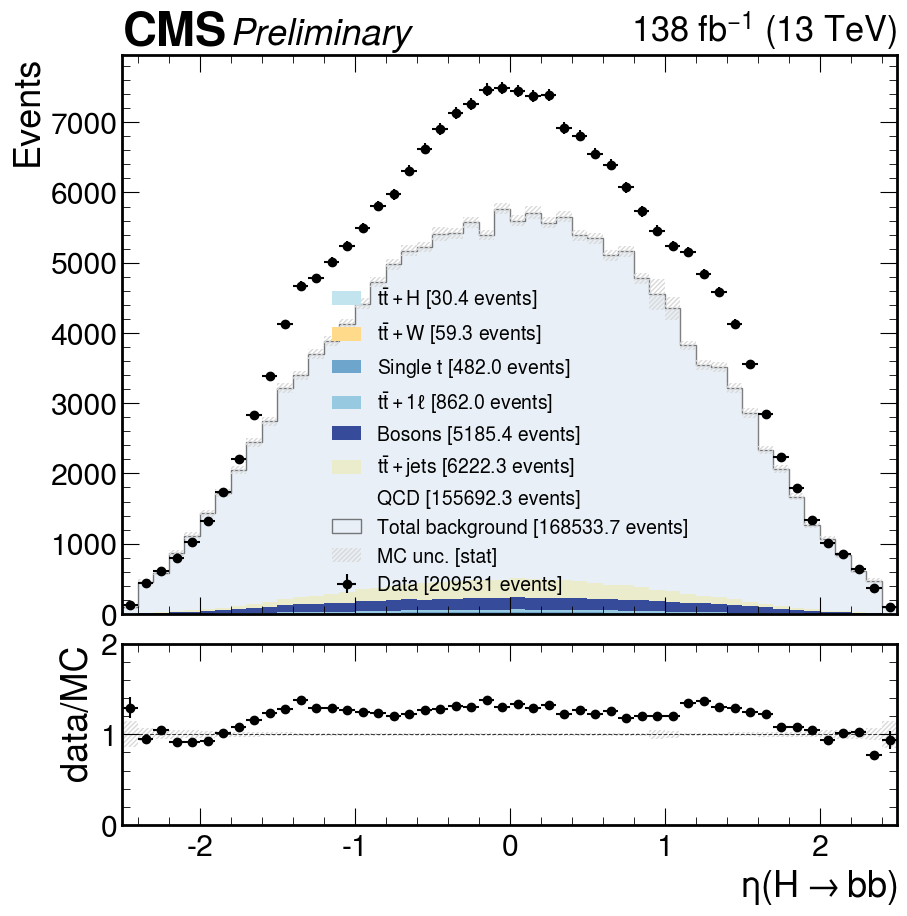

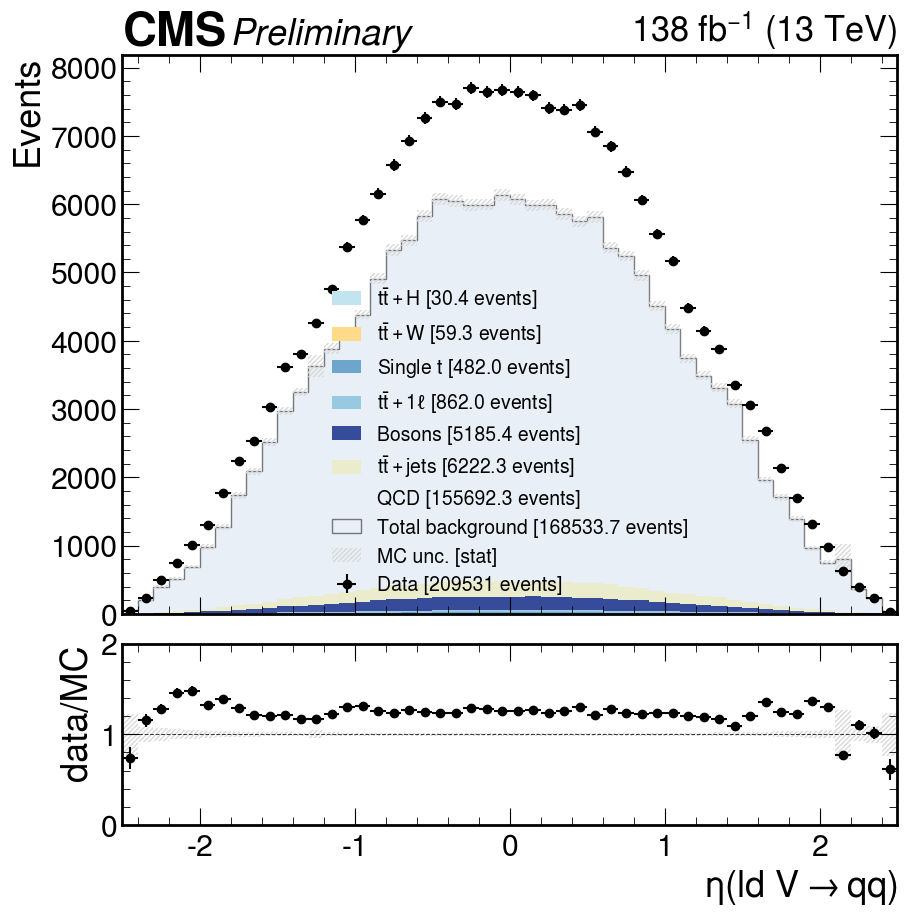

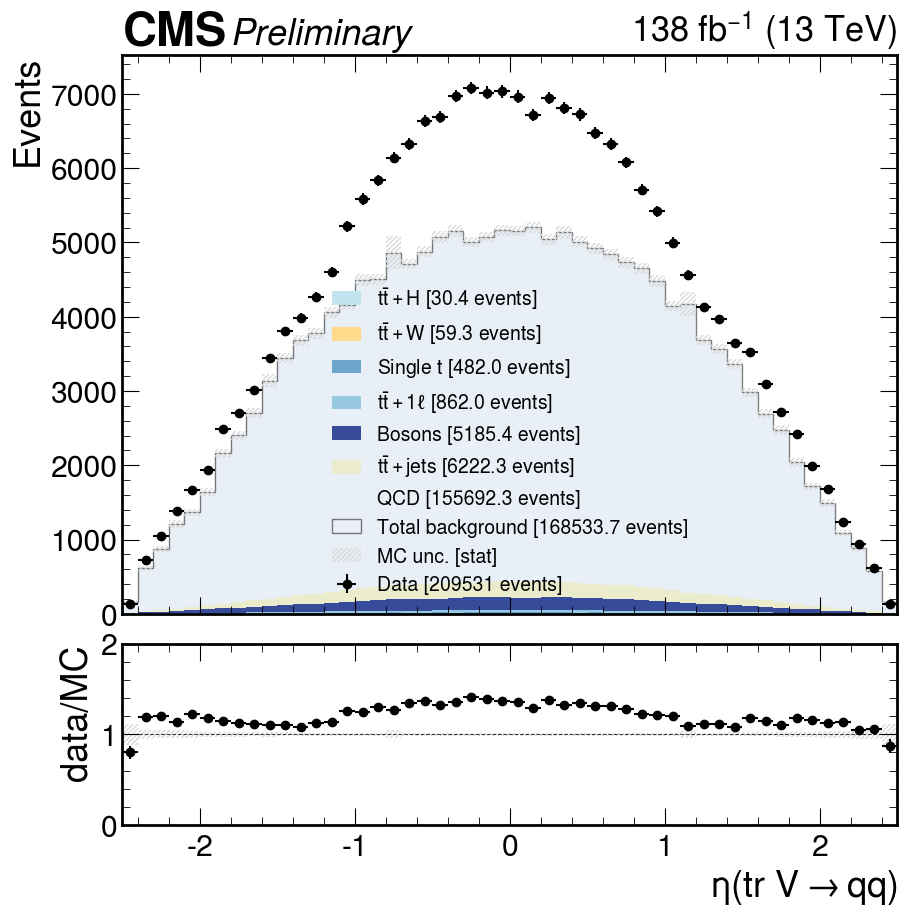

In [7]:
nbins = 50

plot_many(
    [
        # Event-level variables
        ("ST", np.linspace(1000, 3000, nbins+1), r"$S_T$ [GeV]"),
        ("HT", np.linspace(0, 1500, nbins+1), r"$H_{T, AK4}$ [GeV]"),
        ("HT_fat", np.linspace(1000, 3000, nbins+1), r"$H_{T, AK8}$ [GeV]"),
        ("MET", np.linspace(0, 500, nbins+1), "MET [GeV]"),
        ("n_jets", np.linspace(0, 10, 11), r"$N_{AK4}$"),
        ("n_fatjets", np.linspace(0, 10, 11), r"$N_{AK8}$"),
        # VBS variables
        ("M_jj", np.linspace(0, 2000, nbins+1), r"$M_{jj}$ [GeV]"),
        ("abs_deta_jj", np.linspace(0, 10, nbins+1), r"$|\Delta\eta_{jj}|$"),
        ("ld_vbsjet_pt", np.linspace(0, 500, nbins+1), r"$p_T($ld VBS$)$ [GeV]"),
        ("tr_vbsjet_pt", np.linspace(0, 500, nbins+1), r"$p_T($tr VBS$)$ [GeV]"),
        ("ld_vbsjet_eta", np.linspace(-2.5, 2.5, nbins+1), r"$\eta($ld VBS$)$"),
        ("tr_vbsjet_eta", np.linspace(-2.5, 2.5, nbins+1), r"$\eta($tr VBS$)$"),
        # VVH variables
        ("M_VVH", np.linspace(1000, 5000, nbins+1), r"$M_{VVH}$ [GeV]"),
        ("dphi_VV", np.linspace(-4, 4, nbins+1), r"$\Delta\phi($ld $V\rightarrow qq, $tr $V \rightarrow qq)$"),
        ("dphi_ldVH", np.linspace(-4, 4, nbins+1), r"$\Delta\phi(H\rightarrow b\bar{b}, $ld $V \rightarrow qq)$"),
        ("dphi_trVH", np.linspace(-4, 4, nbins+1), r"$\Delta\phi(H\rightarrow b\bar{b}, $tr $V \rightarrow qq)$"),
        # Fat jet MSD
        ("hbbfatjet_msoftdrop", np.linspace(0, 500, nbins+1), r"$M_{SD}(H\rightarrow bb)$ [GeV]"),
        ("ld_vqqfatjet_msoftdrop", np.linspace(0, 500, nbins+1), r"$M_{SD}($ld $V\rightarrow qq)$ [GeV]"),
        ("tr_vqqfatjet_msoftdrop", np.linspace(0, 500, nbins+1), r"$M_{SD}($tr $V\rightarrow qq)$ [GeV]"),
        # Fat jet ParticleNet mass
        ("hbbfatjet_mass", np.linspace(0, 500, nbins+1), r"$M_{PNet}(H\rightarrow bb)$ [GeV]"),
        ("ld_vqqfatjet_mass", np.linspace(0, 500, nbins+1), r"$M_{PNet}($ld $V\rightarrow qq)$ [GeV]"),
        ("tr_vqqfatjet_mass", np.linspace(0, 500, nbins+1), r"$M_{PNet}($tr $V\rightarrow qq)$ [GeV]"),
        # Fat jet pt
        ("hbbfatjet_pt", np.linspace(200, 1700, nbins+1), r"$p_T(H\rightarrow bb)$ [GeV]"),
        ("ld_vqqfatjet_pt", np.linspace(200, 1700, nbins+1), r"$p_T($ld $V\rightarrow qq)$ [GeV]"),
        ("tr_vqqfatjet_pt", np.linspace(200, 1700, nbins+1), r"$p_T($tr $V\rightarrow qq)$ [GeV]"),
        # Fat jet eta
        ("hbbfatjet_eta", np.linspace(-2.5, 2.5, nbins+1), r"$\eta(H\rightarrow bb)$"),
        ("ld_vqqfatjet_eta", np.linspace(-2.5, 2.5, nbins+1), r"$\eta($ld $V\rightarrow qq)$"),
        ("tr_vqqfatjet_eta", np.linspace(-2.5, 2.5, nbins+1), r"$\eta($tr $V\rightarrow qq)$"),
    ],
    sel="obj_sel",
    norm=False,
    sig_scale=0
)

Wrote plot to /home/users/jguiang/public_html/vbsvvhjets_plots/pnetfix/val/ST_data_vs_mc_qcdnorm_CR.pdf
Wrote plot to /home/users/jguiang/public_html/vbsvvhjets_plots/pnetfix/val/HT_data_vs_mc_qcdnorm_CR.pdf
Wrote plot to /home/users/jguiang/public_html/vbsvvhjets_plots/pnetfix/val/HT_fat_data_vs_mc_qcdnorm_CR.pdf
Wrote plot to /home/users/jguiang/public_html/vbsvvhjets_plots/pnetfix/val/MET_data_vs_mc_qcdnorm_CR.pdf
Wrote plot to /home/users/jguiang/public_html/vbsvvhjets_plots/pnetfix/val/n_jets_data_vs_mc_qcdnorm_CR.pdf
Wrote plot to /home/users/jguiang/public_html/vbsvvhjets_plots/pnetfix/val/n_fatjets_data_vs_mc_qcdnorm_CR.pdf
Wrote plot to /home/users/jguiang/public_html/vbsvvhjets_plots/pnetfix/val/M_jj_data_vs_mc_qcdnorm_CR.pdf
Wrote plot to /home/users/jguiang/public_html/vbsvvhjets_plots/pnetfix/val/abs_deta_jj_data_vs_mc_qcdnorm_CR.pdf
Wrote plot to /home/users/jguiang/public_html/vbsvvhjets_plots/pnetfix/val/ld_vbsjet_pt_data_vs_mc_qcdnorm_CR.pdf
Wrote plot to /home/users/j

/home/users/jguiang/projects/vbs/notebooks/utils/analysis.py:702: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure()


Wrote plot to /home/users/jguiang/public_html/vbsvvhjets_plots/pnetfix/val/ld_vqqfatjet_mass_data_vs_mc_qcdnorm_CR.pdf
Wrote plot to /home/users/jguiang/public_html/vbsvvhjets_plots/pnetfix/val/tr_vqqfatjet_mass_data_vs_mc_qcdnorm_CR.pdf
Wrote plot to /home/users/jguiang/public_html/vbsvvhjets_plots/pnetfix/val/hbbfatjet_pt_data_vs_mc_qcdnorm_CR.pdf
Wrote plot to /home/users/jguiang/public_html/vbsvvhjets_plots/pnetfix/val/ld_vqqfatjet_pt_data_vs_mc_qcdnorm_CR.pdf
Wrote plot to /home/users/jguiang/public_html/vbsvvhjets_plots/pnetfix/val/tr_vqqfatjet_pt_data_vs_mc_qcdnorm_CR.pdf
Wrote plot to /home/users/jguiang/public_html/vbsvvhjets_plots/pnetfix/val/hbbfatjet_eta_data_vs_mc_qcdnorm_CR.pdf
Wrote plot to /home/users/jguiang/public_html/vbsvvhjets_plots/pnetfix/val/ld_vqqfatjet_eta_data_vs_mc_qcdnorm_CR.pdf
Wrote plot to /home/users/jguiang/public_html/vbsvvhjets_plots/pnetfix/val/tr_vqqfatjet_eta_data_vs_mc_qcdnorm_CR.pdf


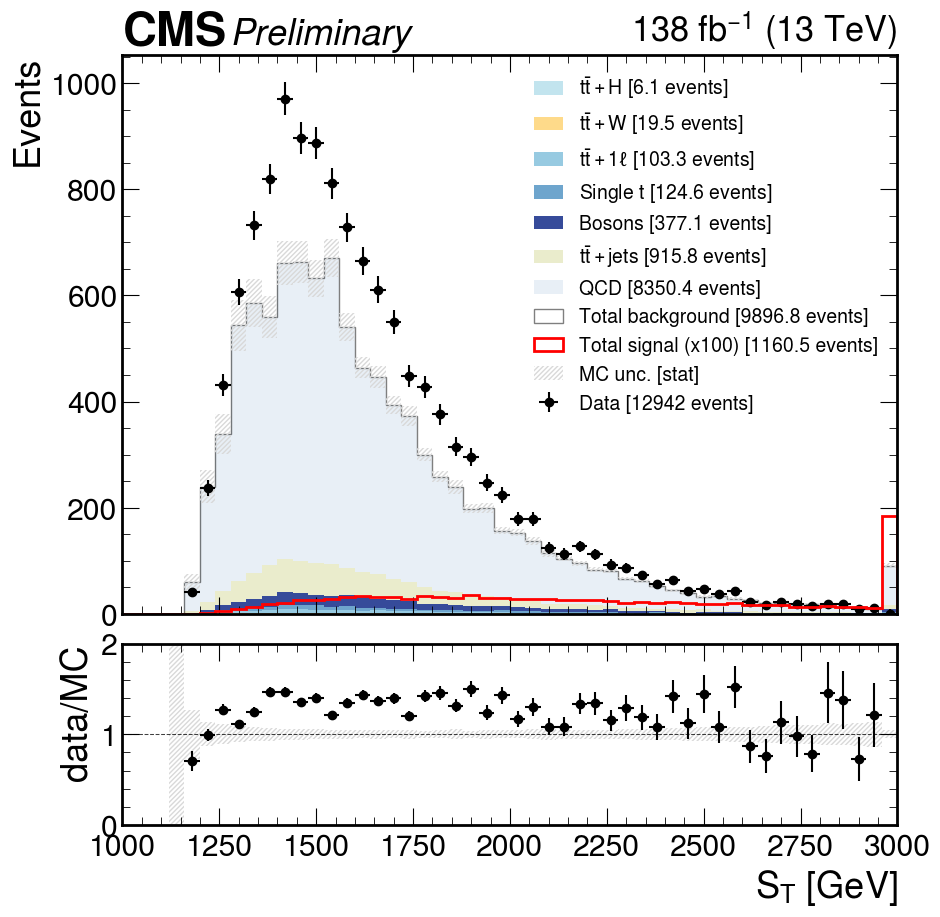

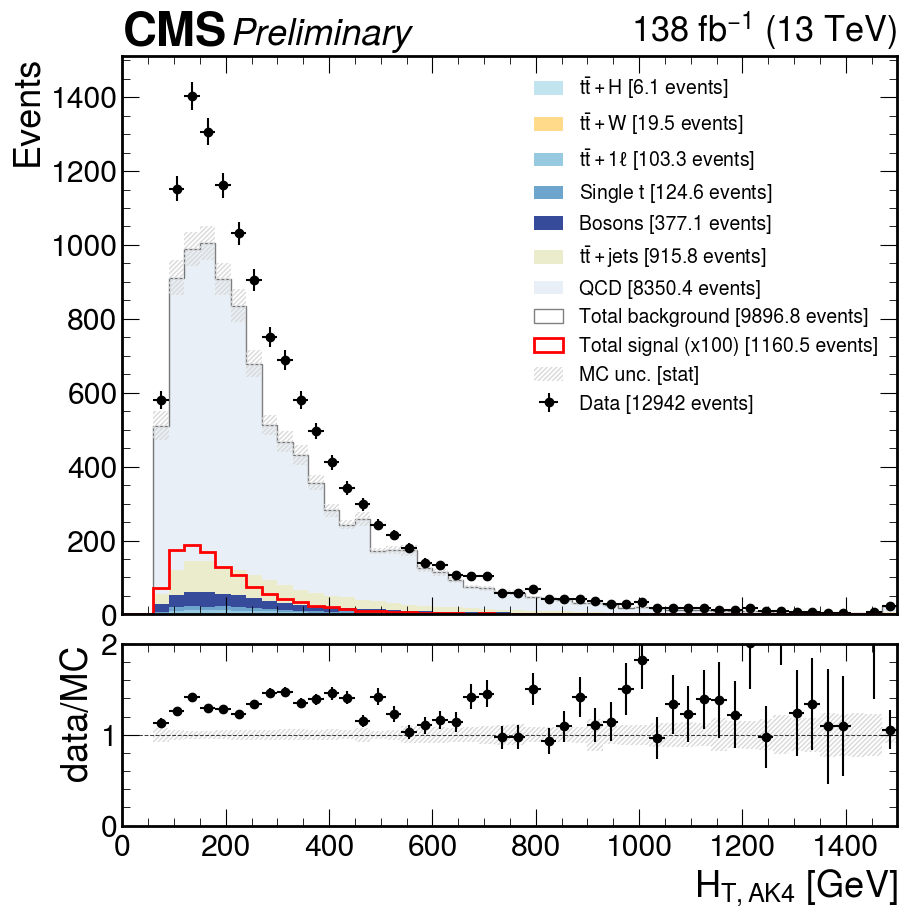

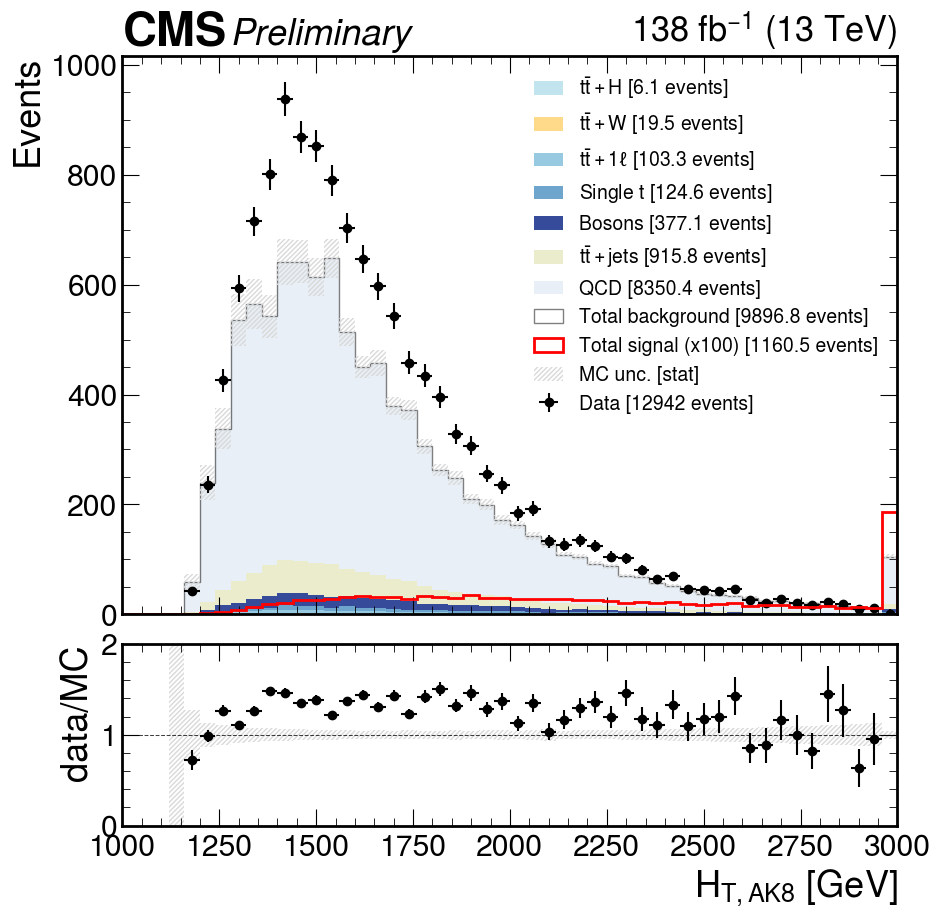

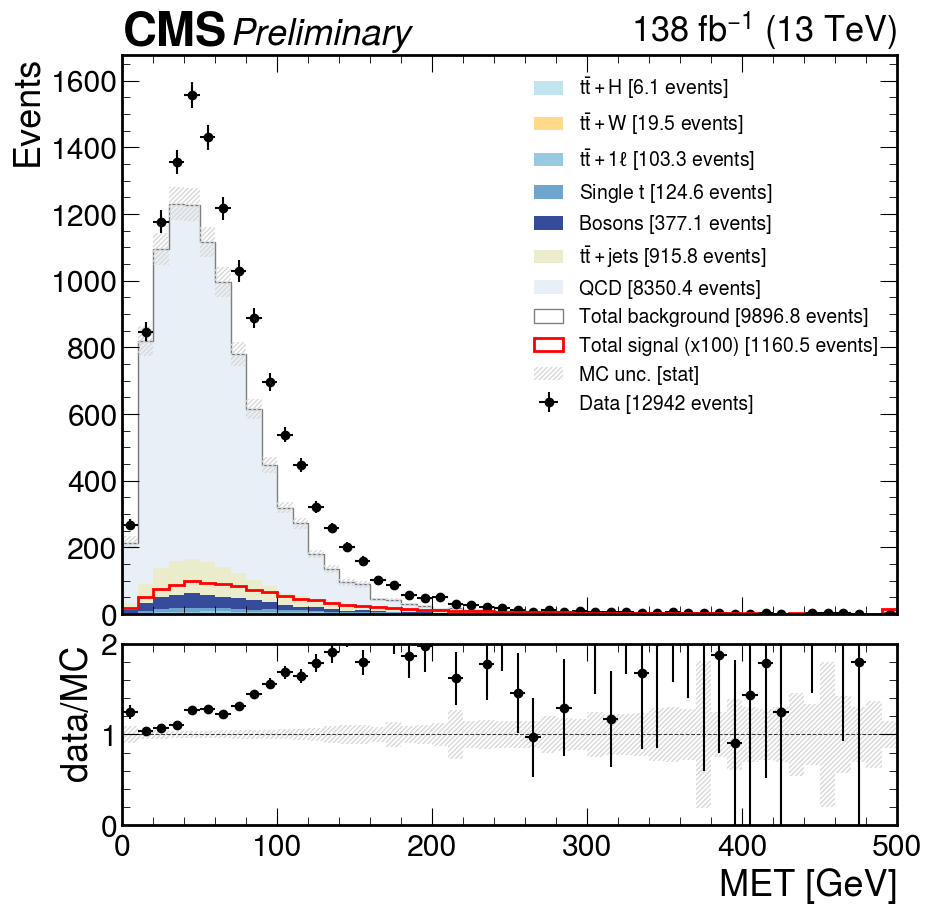

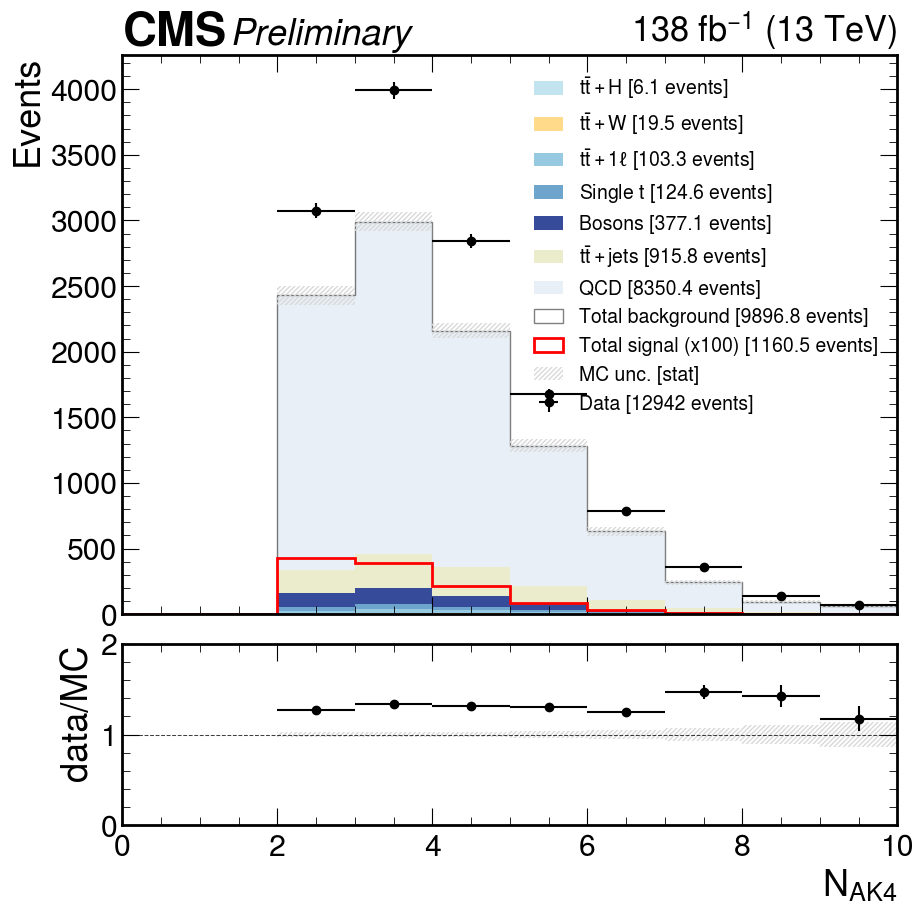

...

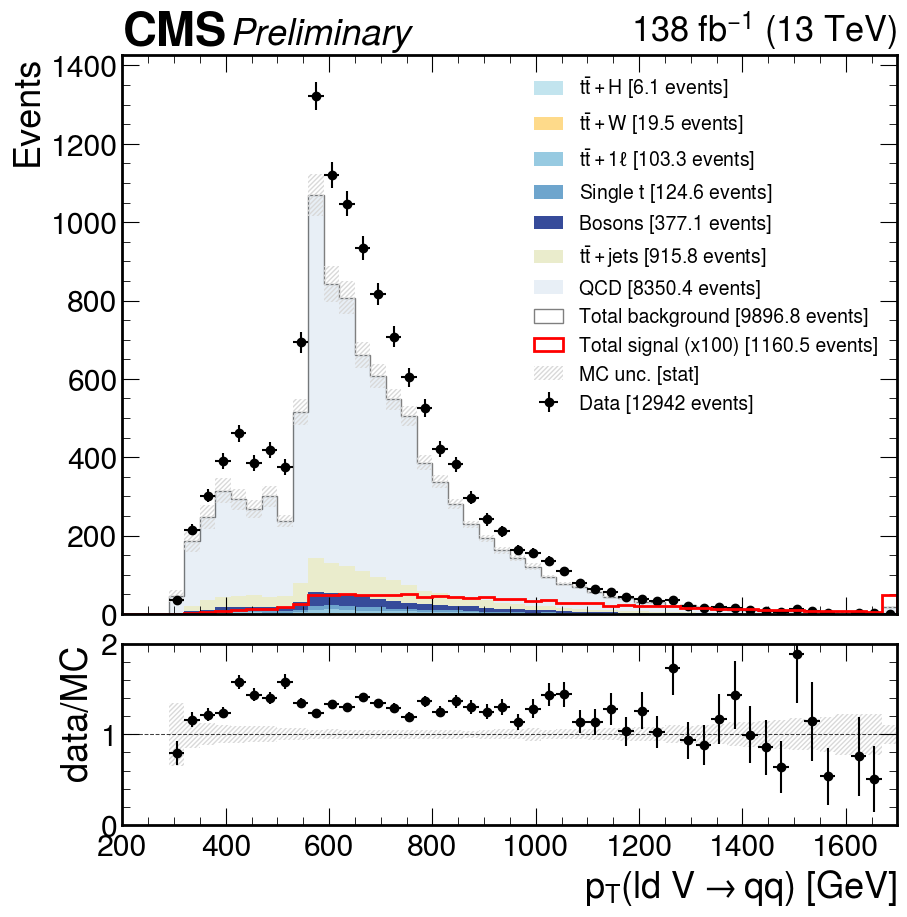

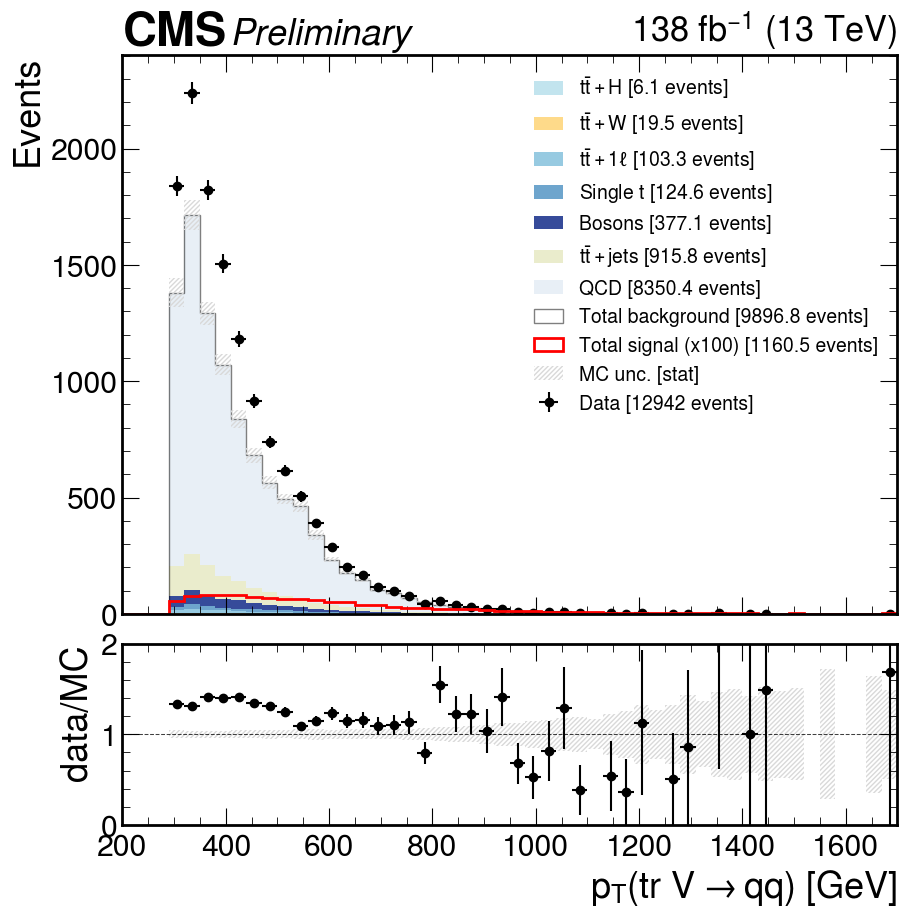

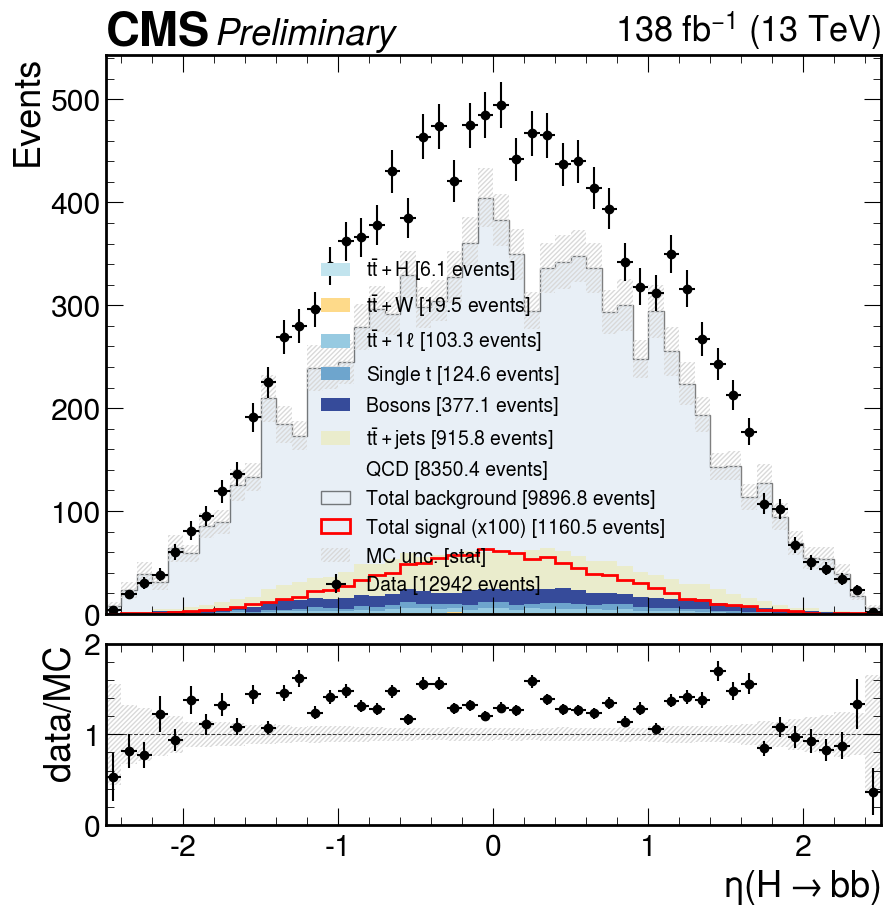

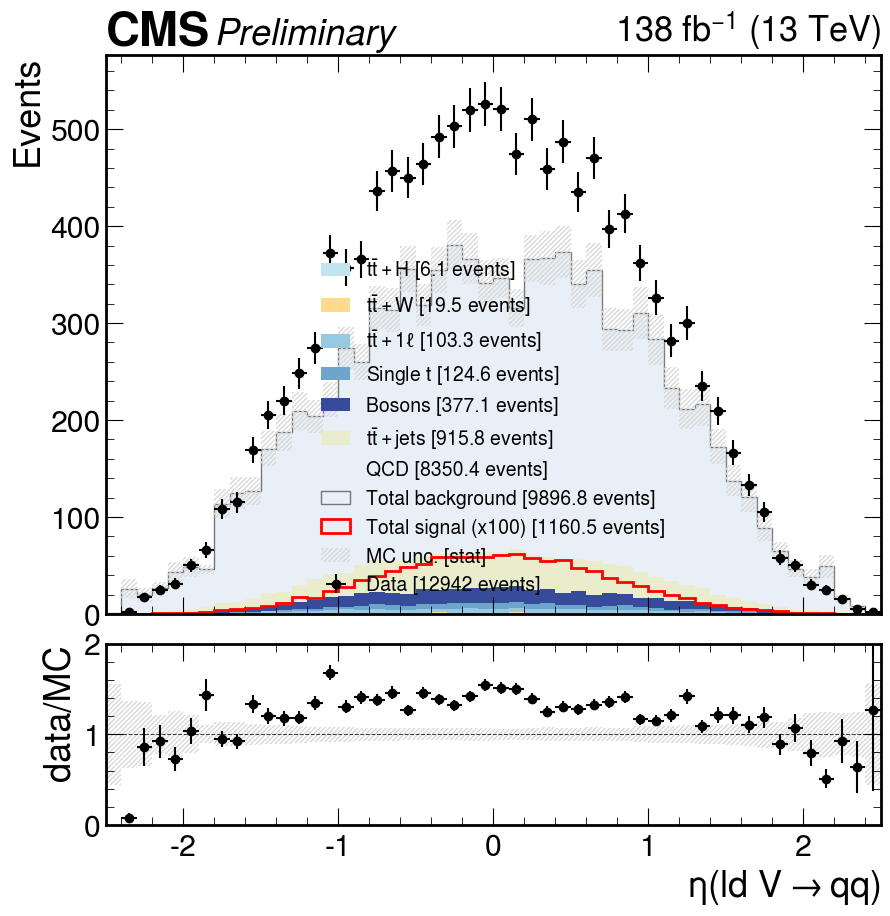

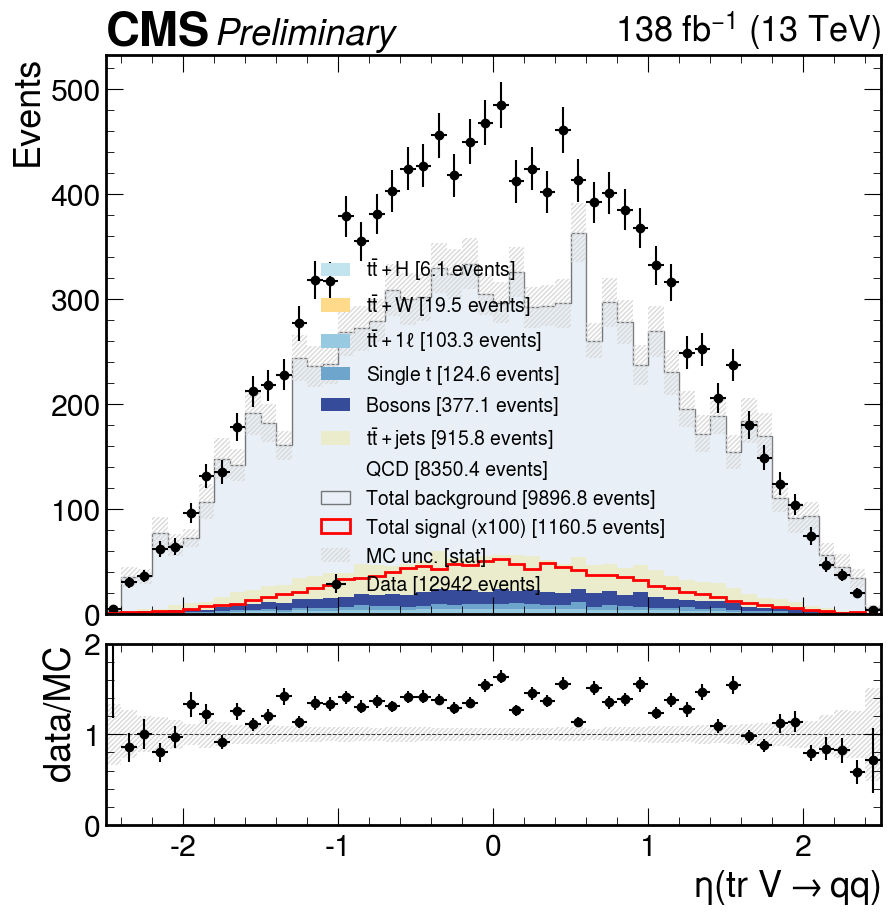

In [52]:
nbins = 50
vbsvvh.df["qcdnorm_CR"] = vbsvvh.df.eval(
    "obj_sel and hbbfatjet_score > 0.1 and ld_vqqfatjet_score > 0.5 and tr_vqqfatjet_score > 0.5"
)

plot_many(
    [
        # Event-level variables
        ("ST", np.linspace(1000, 3000, nbins+1), r"$S_T$ [GeV]"),
        ("HT", np.linspace(0, 1500, nbins+1), r"$H_{T, AK4}$ [GeV]"),
        ("HT_fat", np.linspace(1000, 3000, nbins+1), r"$H_{T, AK8}$ [GeV]"),
        ("MET", np.linspace(0, 500, nbins+1), "MET [GeV]"),
        ("n_jets", np.linspace(0, 10, 11), r"$N_{AK4}$"),
        ("n_fatjets", np.linspace(0, 10, 11), r"$N_{AK8}$"),
        # VBS variables
        ("M_jj", np.linspace(0, 2000, nbins+1), r"$M_{jj}$ [GeV]"),
        ("abs_deta_jj", np.linspace(0, 10, nbins+1), r"$|\Delta\eta_{jj}|$"),
        ("ld_vbsjet_pt", np.linspace(0, 500, nbins+1), r"$p_T($ld VBS$)$ [GeV]"),
        ("tr_vbsjet_pt", np.linspace(0, 500, nbins+1), r"$p_T($tr VBS$)$ [GeV]"),
        ("ld_vbsjet_eta", np.linspace(-2.5, 2.5, nbins+1), r"$\eta($ld VBS$)$"),
        ("tr_vbsjet_eta", np.linspace(-2.5, 2.5, nbins+1), r"$\eta($tr VBS$)$"),
        # VVH variables
        ("M_VVH", np.linspace(1000, 5000, nbins+1), r"$M_{VVH}$ [GeV]"),
        # Fat jet ParticleNet score
        ("hbbfatjet_score", np.linspace(0, 1, nbins+1), r"PNet $X\rightarrow bb(H\rightarrow bb)$"),
        ("ld_vqqfatjet_score", np.linspace(0, 1, nbins+1), r"PNet $XW\rightarrow qq($ld $V\rightarrow qq)$"),
        ("tr_vqqfatjet_score", np.linspace(0, 1, nbins+1), r"PNet $XW\rightarrow qq($tr $V\rightarrow qq)$"),
        # Fat jet MSD
        ("hbbfatjet_msoftdrop", np.linspace(0, 500, nbins+1), r"$M_{SD}(H\rightarrow bb)$ [GeV]"),
        ("ld_vqqfatjet_msoftdrop", np.linspace(0, 500, nbins+1), r"$M_{SD}($ld $V\rightarrow qq)$ [GeV]"),
        ("tr_vqqfatjet_msoftdrop", np.linspace(0, 500, nbins+1), r"$M_{SD}($tr $V\rightarrow qq)$ [GeV]"),
        # Fat jet ParticleNet mass
        ("hbbfatjet_mass", np.linspace(0, 500, nbins+1), r"$M_{PNet}(H\rightarrow bb)$ [GeV]"),
        ("ld_vqqfatjet_mass", np.linspace(0, 500, nbins+1), r"$M_{PNet}($ld $V\rightarrow qq)$ [GeV]"),
        ("tr_vqqfatjet_mass", np.linspace(0, 500, nbins+1), r"$M_{PNet}($tr $V\rightarrow qq)$ [GeV]"),
        # Fat jet pt
        ("hbbfatjet_pt", np.linspace(200, 1700, nbins+1), r"$p_T(H\rightarrow bb)$ [GeV]"),
        ("ld_vqqfatjet_pt", np.linspace(200, 1700, nbins+1), r"$p_T($ld $V\rightarrow qq)$ [GeV]"),
        ("tr_vqqfatjet_pt", np.linspace(200, 1700, nbins+1), r"$p_T($tr $V\rightarrow qq)$ [GeV]"),
        # Fat jet eta
        ("hbbfatjet_eta", np.linspace(-2.5, 2.5, nbins+1), r"$\eta(H\rightarrow bb)$"),
        ("ld_vqqfatjet_eta", np.linspace(-2.5, 2.5, nbins+1), r"$\eta($ld $V\rightarrow qq)$"),
        ("tr_vqqfatjet_eta", np.linspace(-2.5, 2.5, nbins+1), r"$\eta($tr $V\rightarrow qq)$"),
    ],
    sel="qcdnorm_CR",
    norm=False,
    sig_scale=100
)

Wrote plot to /home/users/jguiang/public_html/vbsvvhjets_plots/pnetfix/val/ST_data_vs_mc_bdt_presel.pdf
Wrote plot to /home/users/jguiang/public_html/vbsvvhjets_plots/pnetfix/val/HT_data_vs_mc_bdt_presel.pdf
Wrote plot to /home/users/jguiang/public_html/vbsvvhjets_plots/pnetfix/val/HT_fat_data_vs_mc_bdt_presel.pdf
Wrote plot to /home/users/jguiang/public_html/vbsvvhjets_plots/pnetfix/val/MET_data_vs_mc_bdt_presel.pdf
Wrote plot to /home/users/jguiang/public_html/vbsvvhjets_plots/pnetfix/val/n_jets_data_vs_mc_bdt_presel.pdf
Wrote plot to /home/users/jguiang/public_html/vbsvvhjets_plots/pnetfix/val/n_fatjets_data_vs_mc_bdt_presel.pdf
Wrote plot to /home/users/jguiang/public_html/vbsvvhjets_plots/pnetfix/val/M_jj_data_vs_mc_bdt_presel.pdf
Wrote plot to /home/users/jguiang/public_html/vbsvvhjets_plots/pnetfix/val/abs_deta_jj_data_vs_mc_bdt_presel.pdf
Wrote plot to /home/users/jguiang/public_html/vbsvvhjets_plots/pnetfix/val/ld_vbsjet_pt_data_vs_mc_bdt_presel.pdf
Wrote plot to /home/users/j

/home/users/jguiang/projects/vbs/notebooks/utils/analysis.py:702: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure()


Wrote plot to /home/users/jguiang/public_html/vbsvvhjets_plots/pnetfix/val/ld_vqqfatjet_mass_data_vs_mc_bdt_presel.pdf
Wrote plot to /home/users/jguiang/public_html/vbsvvhjets_plots/pnetfix/val/tr_vqqfatjet_mass_data_vs_mc_bdt_presel.pdf
Wrote plot to /home/users/jguiang/public_html/vbsvvhjets_plots/pnetfix/val/hbbfatjet_pt_data_vs_mc_bdt_presel.pdf
Wrote plot to /home/users/jguiang/public_html/vbsvvhjets_plots/pnetfix/val/ld_vqqfatjet_pt_data_vs_mc_bdt_presel.pdf
Wrote plot to /home/users/jguiang/public_html/vbsvvhjets_plots/pnetfix/val/tr_vqqfatjet_pt_data_vs_mc_bdt_presel.pdf
Wrote plot to /home/users/jguiang/public_html/vbsvvhjets_plots/pnetfix/val/hbbfatjet_eta_data_vs_mc_bdt_presel.pdf
Wrote plot to /home/users/jguiang/public_html/vbsvvhjets_plots/pnetfix/val/ld_vqqfatjet_eta_data_vs_mc_bdt_presel.pdf
Wrote plot to /home/users/jguiang/public_html/vbsvvhjets_plots/pnetfix/val/tr_vqqfatjet_eta_data_vs_mc_bdt_presel.pdf


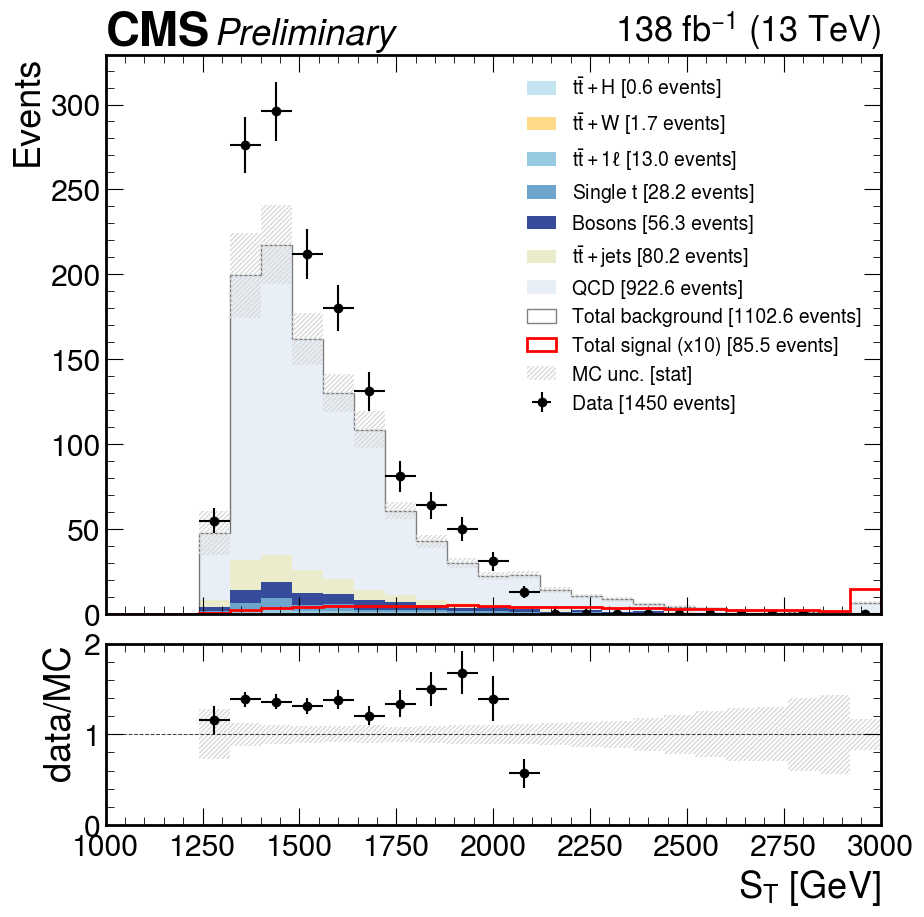

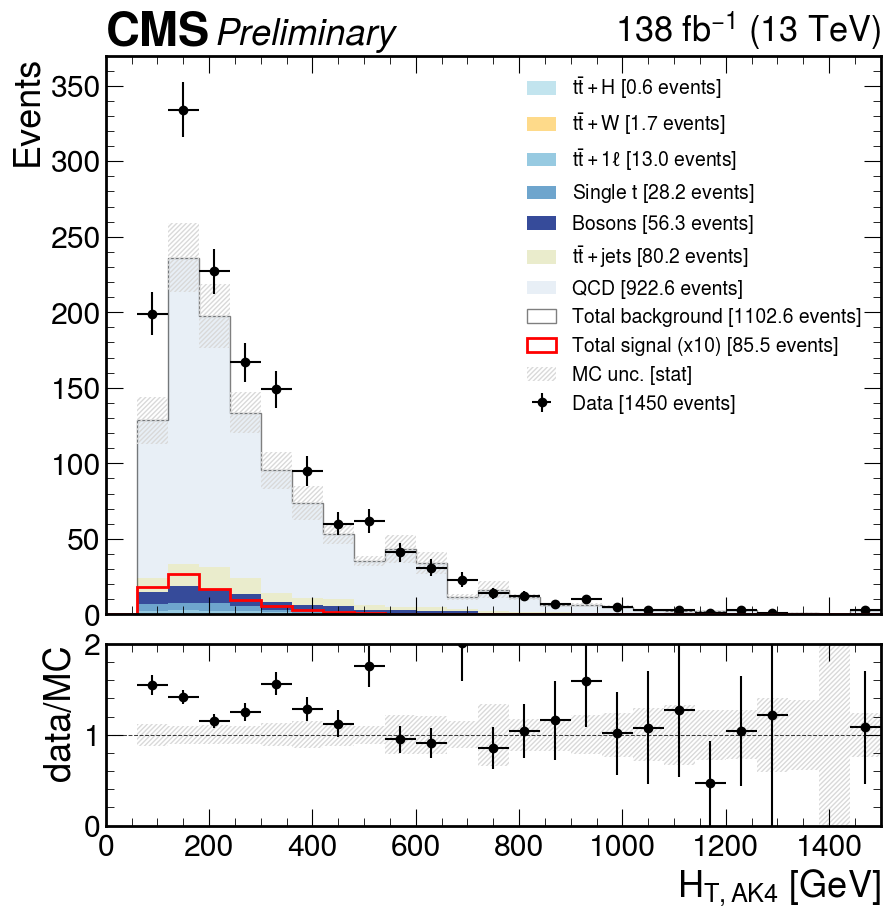

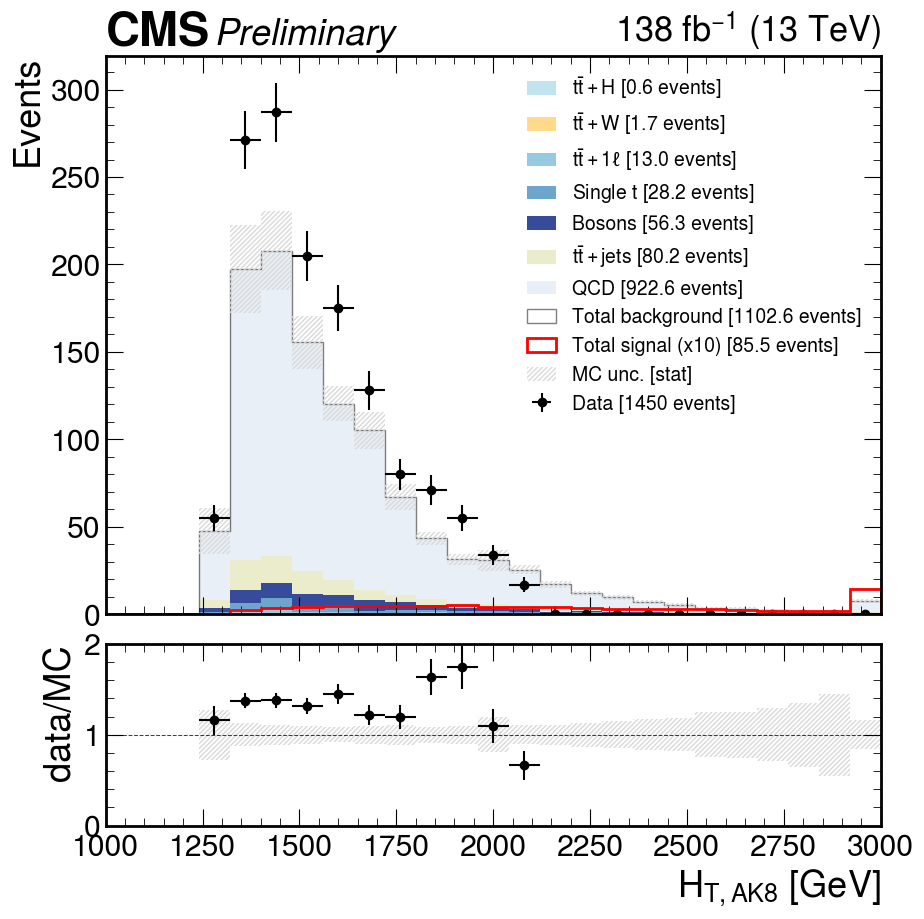

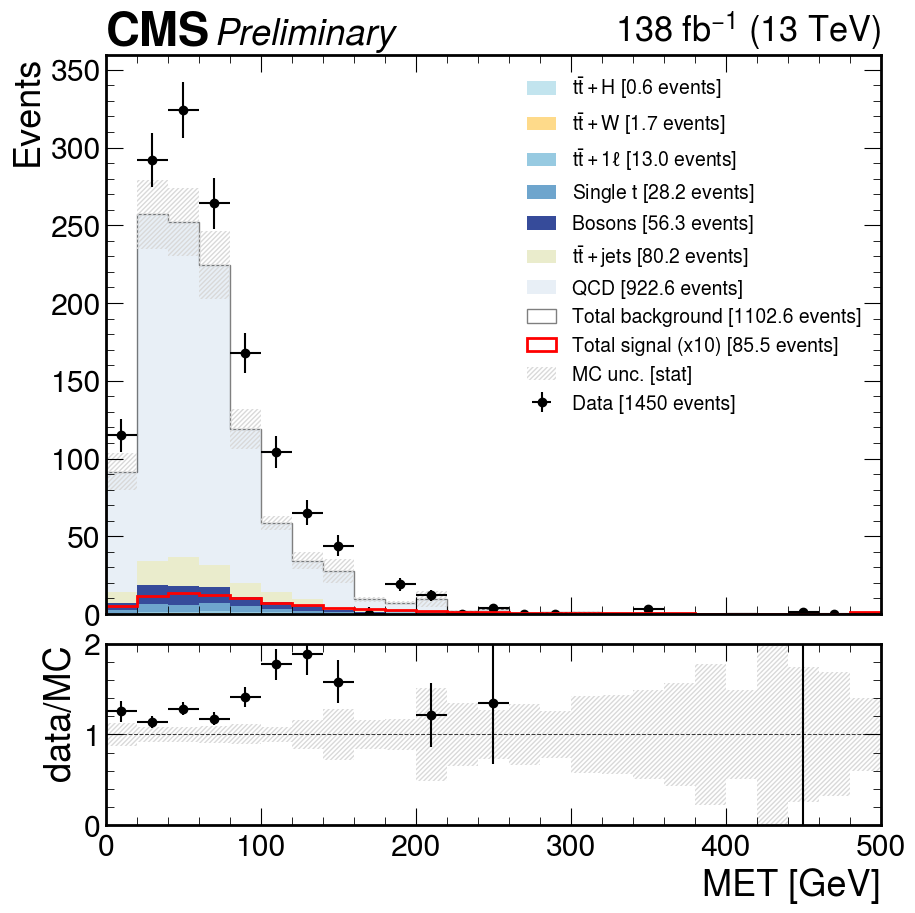

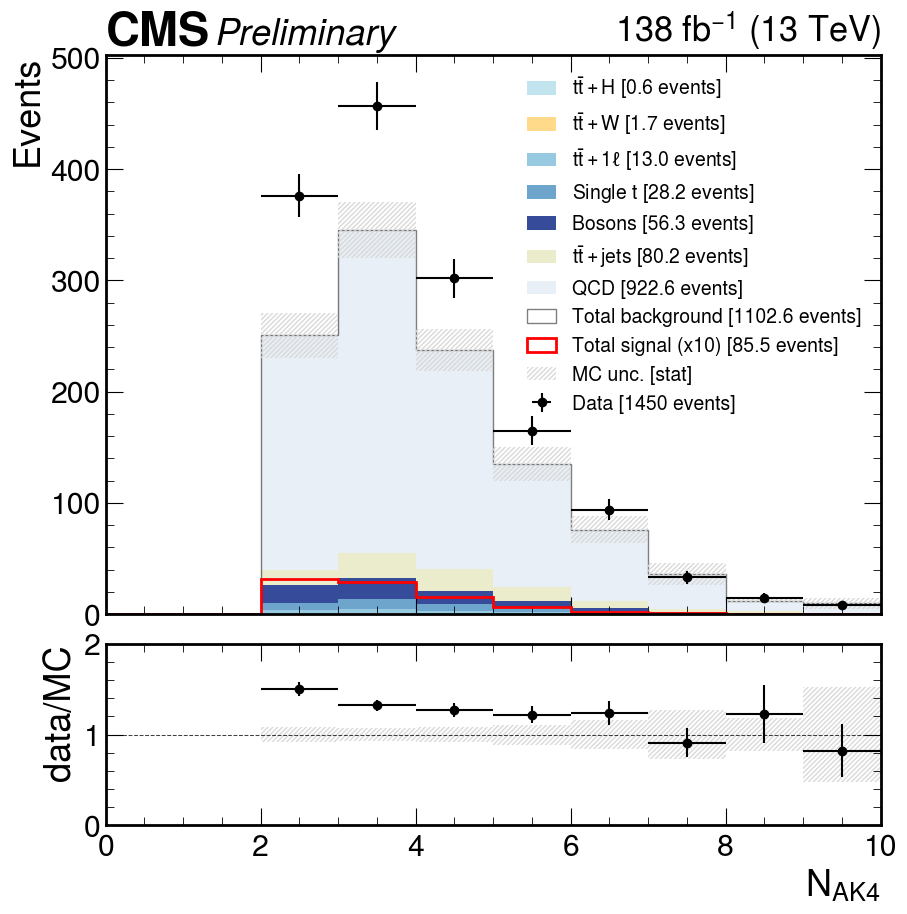

...

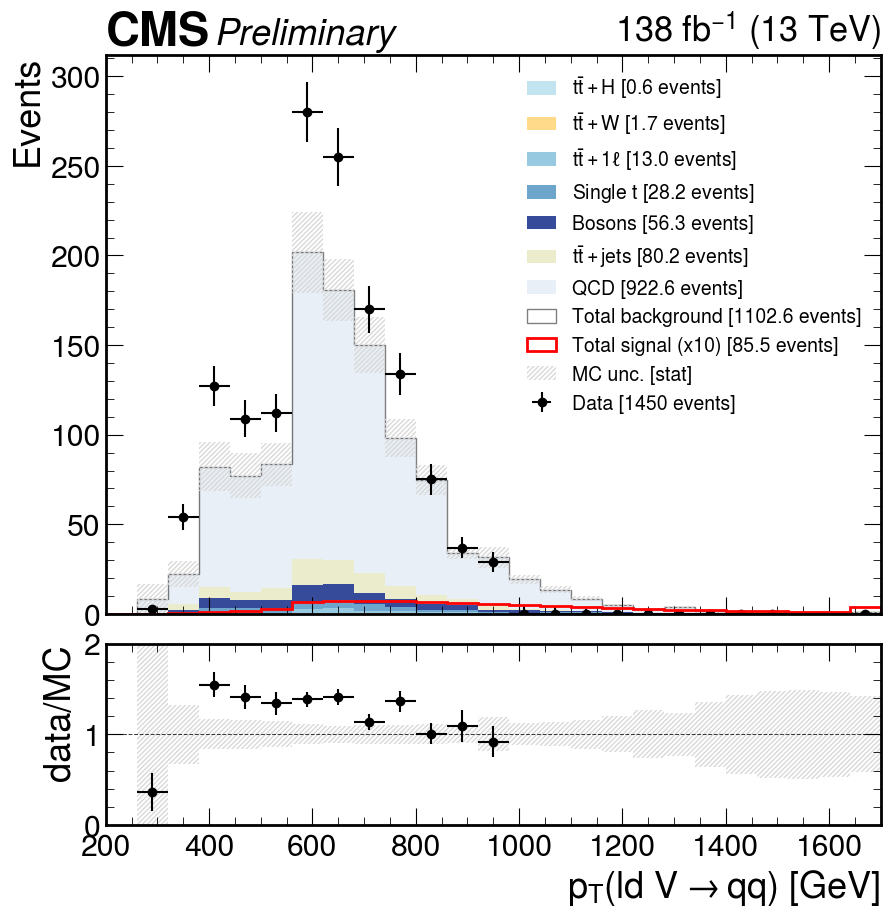

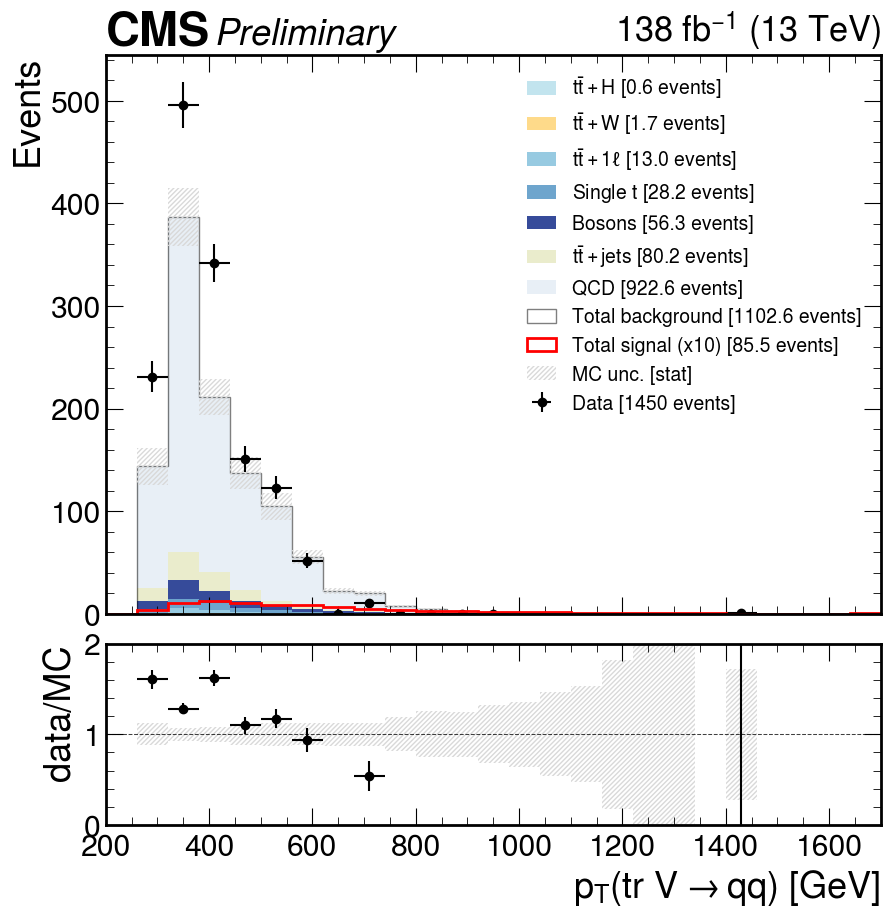

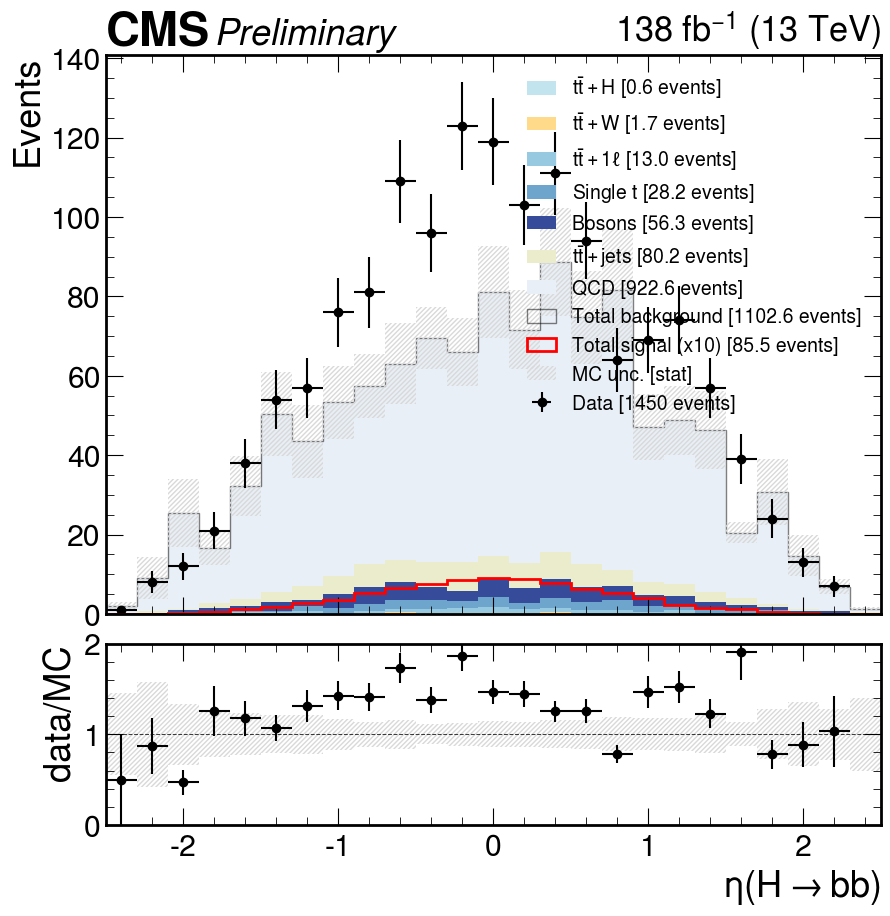

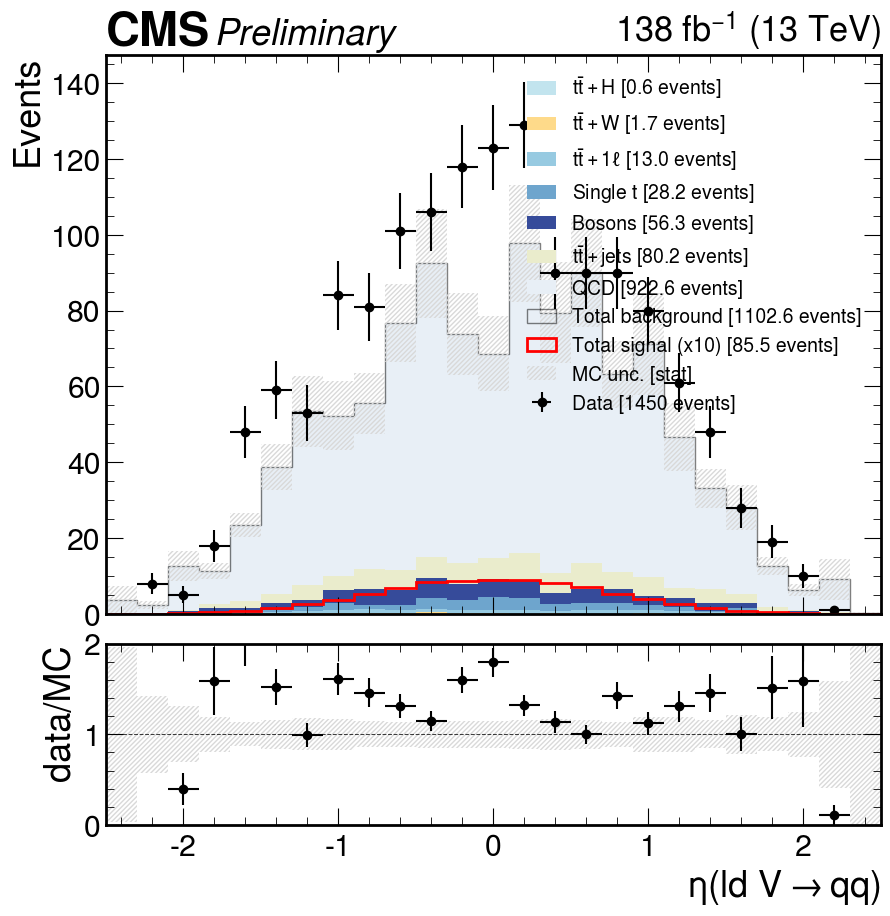

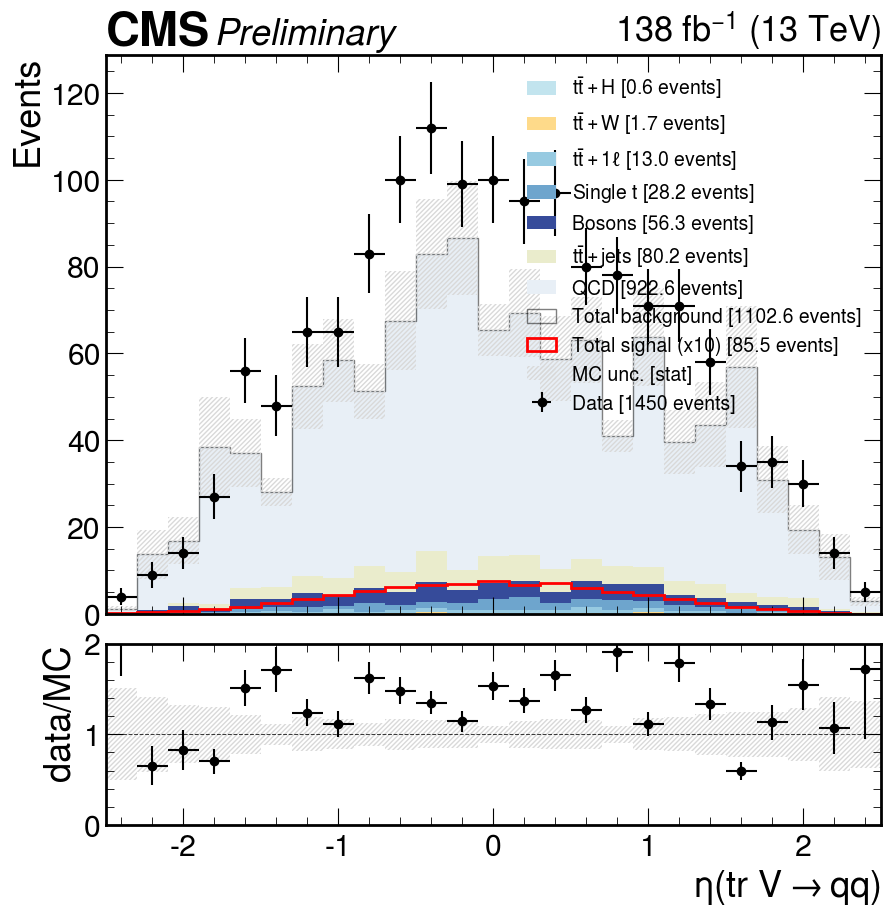

In [19]:
nbins = 25

plot_many(
    [
        # Event-level variables
        ("ST", np.linspace(1000, 3000, nbins+1), r"$S_T$ [GeV]"),
        ("HT", np.linspace(0, 1500, nbins+1), r"$H_{T, AK4}$ [GeV]"),
        ("HT_fat", np.linspace(1000, 3000, nbins+1), r"$H_{T, AK8}$ [GeV]"),
        ("MET", np.linspace(0, 500, nbins+1), "MET [GeV]"),
        ("n_jets", np.linspace(0, 10, 11), r"$N_{AK4}$"),
        ("n_fatjets", np.linspace(0, 10, 11), r"$N_{AK8}$"),
        # VBS variables
        ("M_jj", np.linspace(0, 2000, nbins+1), r"$M_{jj}$ [GeV]"),
        ("abs_deta_jj", np.linspace(0, 10, nbins+1), r"$|\Delta\eta_{jj}|$"),
        ("ld_vbsjet_pt", np.linspace(0, 500, nbins+1), r"$p_T($ld VBS$)$ [GeV]"),
        ("tr_vbsjet_pt", np.linspace(0, 500, nbins+1), r"$p_T($tr VBS$)$ [GeV]"),
        ("ld_vbsjet_eta", np.linspace(-2.5, 2.5, nbins+1), r"$\eta($ld VBS$)$"),
        ("tr_vbsjet_eta", np.linspace(-2.5, 2.5, nbins+1), r"$\eta($tr VBS$)$"),
        # VVH variables
        ("M_VVH", np.linspace(1000, 5000, nbins+1), r"$M_{VVH}$ [GeV]"),
        # Fat jet ParticleNet score
        ("hbbfatjet_score", np.linspace(0, 1, nbins+1), r"PNet $X\rightarrow bb(H\rightarrow bb)$"),
        ("ld_vqqfatjet_score", np.linspace(0, 1, nbins+1), r"PNet $XW\rightarrow qq($ld $V\rightarrow qq)$"),
        ("tr_vqqfatjet_score", np.linspace(0, 1, nbins+1), r"PNet $XW\rightarrow qq($tr $V\rightarrow qq)$"),
        # Fat jet MSD
        ("hbbfatjet_msoftdrop", np.linspace(0, 500, nbins+1), r"$M_{SD}(H\rightarrow bb)$ [GeV]"),
        ("ld_vqqfatjet_msoftdrop", np.linspace(0, 500, nbins+1), r"$M_{SD}($ld $V\rightarrow qq)$ [GeV]"),
        ("tr_vqqfatjet_msoftdrop", np.linspace(0, 500, nbins+1), r"$M_{SD}($tr $V\rightarrow qq)$ [GeV]"),
        # Fat jet ParticleNet mass
        ("hbbfatjet_mass", np.linspace(0, 500, nbins+1), r"$M_{PNet}(H\rightarrow bb)$ [GeV]"),
        ("ld_vqqfatjet_mass", np.linspace(0, 500, nbins+1), r"$M_{PNet}($ld $V\rightarrow qq)$ [GeV]"),
        ("tr_vqqfatjet_mass", np.linspace(0, 500, nbins+1), r"$M_{PNet}($tr $V\rightarrow qq)$ [GeV]"),
        # Fat jet pt
        ("hbbfatjet_pt", np.linspace(200, 1700, nbins+1), r"$p_T(H\rightarrow bb)$ [GeV]"),
        ("ld_vqqfatjet_pt", np.linspace(200, 1700, nbins+1), r"$p_T($ld $V\rightarrow qq)$ [GeV]"),
        ("tr_vqqfatjet_pt", np.linspace(200, 1700, nbins+1), r"$p_T($tr $V\rightarrow qq)$ [GeV]"),
        # Fat jet eta
        ("hbbfatjet_eta", np.linspace(-2.5, 2.5, nbins+1), r"$\eta(H\rightarrow bb)$"),
        ("ld_vqqfatjet_eta", np.linspace(-2.5, 2.5, nbins+1), r"$\eta($ld $V\rightarrow qq)$"),
        ("tr_vqqfatjet_eta", np.linspace(-2.5, 2.5, nbins+1), r"$\eta($tr $V\rightarrow qq)$"),
    ],
    sel="bdt_presel",
    norm=False,
    sig_scale=10
)